# Performing a simple soil moisture water budget

In [1]:
import warnings
from pathlib import Path
import itertools

import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import statsmodels.api as sm
from scipy import stats
from statsmodels.formula.api import ols
import seaborn as sns

from utils import *
from methodology import *

# Data Wrangling

## BB-NF

100%|██████████| 61027/61027 [02:09<00:00, 470.81it/s]


A
C


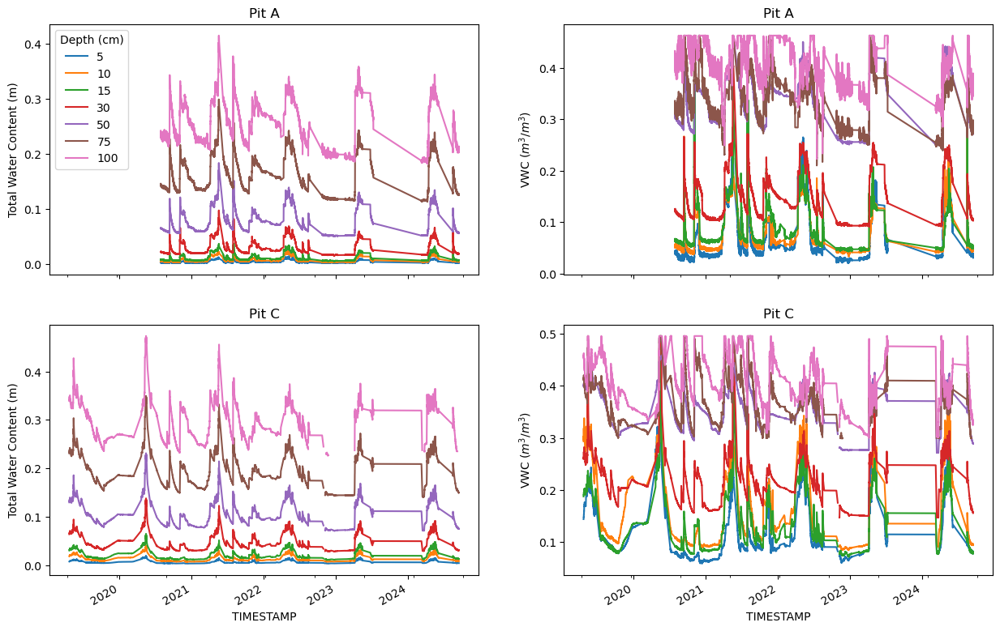

In [50]:
soil_data_dir = Path("/cluster/alcova/wycehg/TempData/Bretfeld Mario/Chimney/Data/data_xfer/soils/BB-NF")
cs616_files = soil_data_dir.glob("TOA5*CS616*.dat")
dfs = []
cs616 = pd.concat([
   (
        pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
        .filter(regex="^WC.+_Avg$|TIMESTAMP", axis=1)
        .rename(
            columns={'WC_C5cm_Avg':"VWC_C-5",
                     'WC_C10cm_Avg':"VWC_C-10",
                     'WC_C15cm_Avg':"VWC_C-15",
                     'WC_C30cm_Avg':"VWC_C-30",
                     'WC_C50cm_Avg':"VWC_C-50"}
        )
    )
    for f in cs616_files
])

hydra_files = soil_data_dir.glob("TOA5*HydraProbe*.dat")
hydra = pd.concat([
    pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
    .filter(regex='^Soil_Moist.+_Avg|TIMESTAMP', axis=1)
    .rename(
        columns={'Soil_Moist_A5cm_Avg':"VWC_A-5", 
                 'Soil_Moist_A10cm_Avg':"VWC_A-10",
                 'Soil_Moist_A15cm_Avg':"VWC_A-15", 
                 'Soil_Moist_A30cm_Avg':"VWC_A-30", 
                 'Soil_Moist_A50cm_Avg':"VWC_A-50",
                 'Soil_Moist_B5cm_Avg':"VWC_B-5", 
                 'Soil_Moist_B10cm_Avg':"VWC_B-10", 
                 'Soil_Moist_B15cm_Avg':"VWC_B-15",
                 'Soil_Moist_B30cm_Avg':"VWC_B-30", 
                 'Soil_Moist_B50cm_Avg':"VWC_B-50"}
    )
    for f in hydra_files
])

soil_nf = (
    hydra
    .merge(cs616, on="TIMESTAMP", how="outer")
    .sort_values("TIMESTAMP")
    .drop_duplicates(subset="TIMESTAMP")
    .set_index("TIMESTAMP")
    .interpolate(limit=48*7)
)


soil_nf = soil_nf.reset_index().sort_values("TIMESTAMP").set_index("TIMESTAMP")
# something is wrong with the data from pit B. Drop it.
soil_nf = soil_nf.filter(regex="VWC_[AC]")

# filter for field capacity + realistic values
theta_s = soil_nf.filter(regex="VWC").quantile([0.97]).max(1).values[0]
field_capacity = theta_s*0.8

pits = sorted(list(set([c.split("_")[-1][0] for c in soil_nf.columns])))
soil_nf = extrapolate_vwc(soil_nf, pits=pits, method="power")


depths = [5, 10, 15, 30, 50, 75, 100]
soil_nf = compute_s(soil_nf, depths, pits, field_capacity)


h_nf = soil_nf.filter(regex=f"h_[ABC]-[0-9]+$").copy()
vwc_nf = soil_nf.filter(regex=f"VWC_[ABC]-[0-9]+$").copy()

fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_nf.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")

    vwc_nf.filter(regex=f"VWC_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("VWC ($m^3/m^3$)")
    axs[i, 0].set_title(f"Pit {pit}")
    axs[i, 1].set_title(f"Pit {pit}")
axs[0, 0].legend(title="Depth (cm)", labels=depths);
    
soil_nf.to_csv("soil_nf.csv")

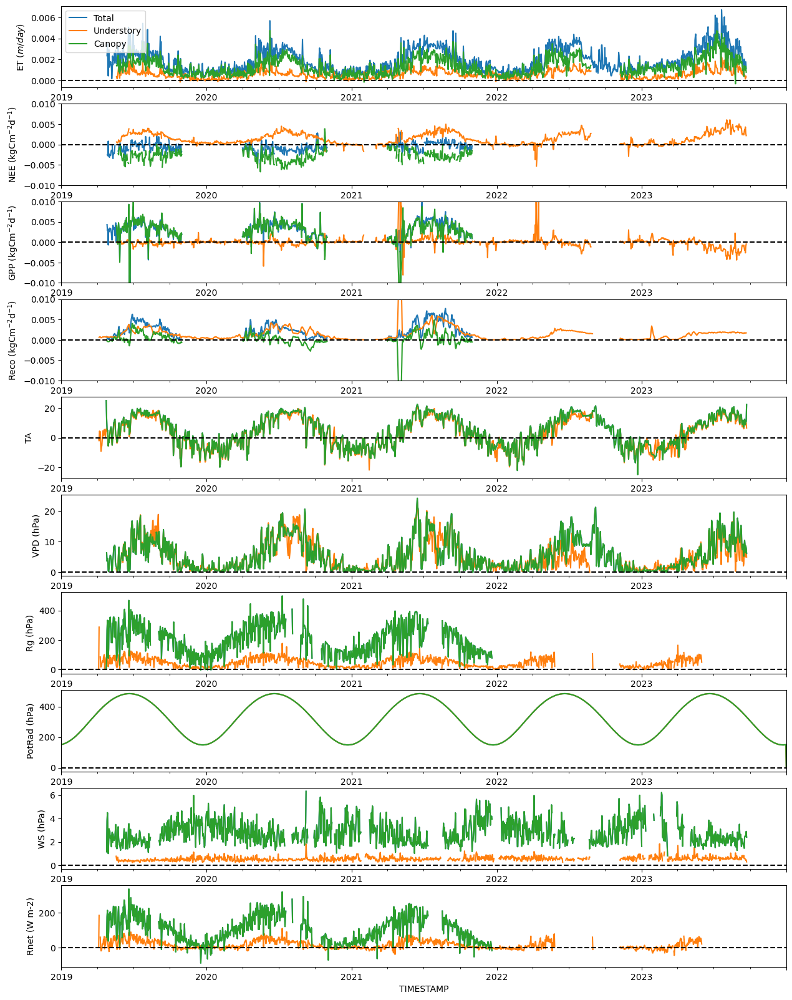

In [87]:
#### Ecosystem
flux_nf = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-17m_proc_.tsv')

flux_nf["NEE"] = np.where((flux_nf.index.year < 2022) & (flux_nf.index.month.isin([4, 5, 6, 7, 8, 9, 10])), flux_nf["NEE"], np.nan)
flux_nf["GPP"] = np.where((flux_nf.index.year < 2022) & (flux_nf.index.month.isin([4, 5, 6, 7, 8, 9, 10])), flux_nf["GPP"], np.nan)
flux_nf["Reco"] = np.where((flux_nf.index.year < 2022) & (flux_nf.index.month.isin([4, 5, 6, 7, 8, 9, 10])), flux_nf["Reco"], np.nan)
flux_nf["NEE"] = np.where(flux_nf["NEE"].abs() > 0.03, np.nan, flux_nf["NEE"])
flux_nf["GPP"] = np.where(flux_nf["NEE"].abs() > 0.03, np.nan, flux_nf["GPP"])
flux_nf["Reco"] = np.where(flux_nf["NEE"].abs() > 0.03, np.nan, flux_nf["Reco"])

compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-17m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-17m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-17m_Rnet.csv'), 
)
compare["Rg"] = np.where(compare.index.year < 2022, compare["Rg"], np.nan)
compare["Rnet"] = np.where(compare.index.year < 2022, compare["Rnet"], np.nan)
flux_nf = flux_nf.merge(compare, left_index=True, right_index=True, how="outer")

#### Understory
flux_nf_under = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-3m_proc_.tsv')
flux_nf_under["NEE"] = np.where(flux_nf_under["NEE"].abs() > 0.03, np.nan, flux_nf_under["NEE"])
flux_nf_under["GPP"] = np.where(flux_nf_under["NEE"].abs() > 0.03, np.nan, flux_nf_under["GPP"])
flux_nf_under["Reco"] = np.where(flux_nf_under["NEE"].abs() > 0.03, np.nan, flux_nf_under["Reco"])

flux_nf_under["NEE"] = np.where(~((flux_nf_under.index.year == 2021) & (flux_nf.index.month == 2)), flux_nf_under["NEE"], np.nan)
flux_nf_under["GPP"] = np.where(~((flux_nf_under.index.year == 2021) & (flux_nf.index.month == 2)), flux_nf_under["GPP"], np.nan)
flux_nf_under["Reco"] = np.where(~((flux_nf_under.index.year == 2021) & (flux_nf.index.month == 2)), flux_nf_under["Reco"], np.nan)
# flux_nf_under["NEE"] = np.where((flux_nf_under.index <= "2022-04-05") | (flux_nf_under.index >= "2022-04-15") , flux_nf_under["NEE"], np.nan)
# flux_nf_under["GPP"] = np.where((flux_nf_under.index <= "2022-04-05") | (flux_nf_under.index >= "2022-04-15") , flux_nf_under["GPP"], np.nan)
# flux_nf_under["Reco"] = np.where((flux_nf_under.index <= "2022-04-05") | (flux_nf_under.index >= "2022-04-15") , flux_nf_under["Reco"], np.nan)


compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-3m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-NF-3m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-NF-3m_Rnet.csv'), 
)
flux_nf_under = flux_nf_under.merge(compare, left_index=True, right_index=True, how="outer")

#### Canopy
flux_nf_can = flux_nf.copy()
flux_nf_can[["ET", "NEE", "GPP", "Reco"]] = flux_nf[["ET", "NEE", "GPP", "Reco"]] - flux_nf_under[["ET", "NEE", "GPP", "Reco"]]


fig, axs = plt.subplots(10, 1, figsize=(15, 20))

(flux_nf.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);
(flux_nf_under.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);
(flux_nf_can.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);

(flux_nf.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_under.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_can.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_nf.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_under.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_can.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_nf.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_under.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_nf_can.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));

flux_nf.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);
flux_nf_under.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);
flux_nf_can.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);

flux_nf.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);
flux_nf_under.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);
flux_nf_can.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);

flux_nf.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (hPa)", ax=axs[6], legend=False);
flux_nf_under.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (hPa)", ax=axs[6], legend=False);
flux_nf_can.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (hPa)", ax=axs[6], legend=False);

flux_nf.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="PotRad (hPa)", ax=axs[7], legend=False);
flux_nf_under.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="PotRad (hPa)", ax=axs[7], legend=False);
flux_nf_can.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="PotRad (hPa)", ax=axs[7], legend=False);

flux_nf.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (hPa)", ax=axs[8], legend=False);
flux_nf_under.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (hPa)", ax=axs[8], legend=False);
flux_nf_can.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (hPa)", ax=axs[8], legend=False);

flux_nf.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);
flux_nf_under.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);
flux_nf_can.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);

axs[0].legend(["Total", "Understory", "Canopy"])

for ax in axs:
    ax.hlines(0, *ax.get_xlim(), "k", "--")

In [84]:
nf_data = flux_nf.merge(soil_nf, left_index=True, right_index=True, how="inner")
nf_data.to_csv("NF_data.csv")

nf_under_data = flux_nf_under.merge(soil_nf, left_index=True, right_index=True, how="inner")
nf_under_data.to_csv("NF_understory_data.csv")

nf_can_data = flux_nf_can.merge(soil_nf, left_index=True, right_index=True, how="inner")
nf_can_data.to_csv("NF_canopy_data.csv")

## BB-UF

100%|██████████| 62873/62873 [03:21<00:00, 311.53it/s]


A
B
C


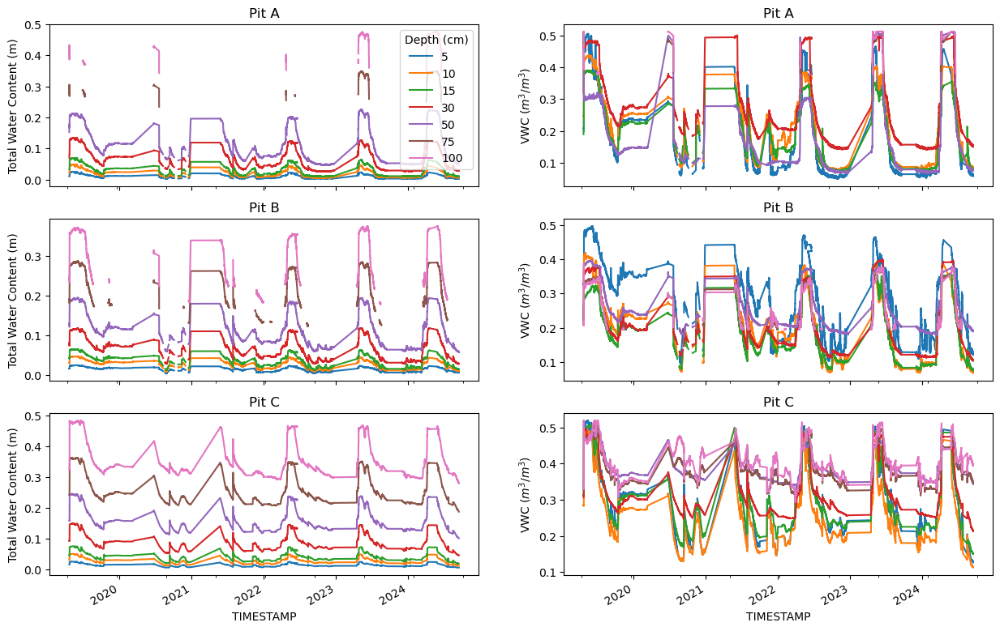

In [33]:
soil_data_dir = Path("/cluster/alcova/wycehg/TempData/Bretfeld Mario/Chimney/Data/data_xfer/soils/BB-UF")
cs616_files = soil_data_dir.glob("TOA5*CS616*.dat")
dfs = []
cs616 = pd.concat([
   (
        pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
        .filter(regex="^WC.+_Avg$|TIMESTAMP", axis=1)
        .rename(
            columns={'WC_C5cm_Avg':"VWC_C-5",
                     'WC_C10cm_Avg':"VWC_C-10",
                     'WC_C15cm_Avg':"VWC_C-15",
                     'WC_C30cm_Avg':"VWC_C-30",
                     'WC_C50cm_Avg':"VWC_C-50"}
        )
    )
    for f in cs616_files
])

hydra_files = soil_data_dir.glob("TOA5*tevens*.dat")
hydra = pd.concat([
    pd.read_csv(f, skiprows=[0, 2, 3], parse_dates=["TIMESTAMP"])
    .filter(regex='^Soil_Moist.+_Avg|TIMESTAMP', axis=1)
    .rename(
        columns={'Soil_Moist_A5cm_Avg':"VWC_A-5", 
                 'Soil_Moist_A10cm_Avg':"VWC_A-10",
                 'Soil_Moist_A15cm_Avg':"VWC_A-15", 
                 'Soil_Moist_A30cm_Avg':"VWC_A-30", 
                 'Soil_Moist_A50cm_Avg':"VWC_A-50",
                 'Soil_Moist_B5cm_Avg':"VWC_B-5", 
                 'Soil_Moist_B10cm_Avg':"VWC_B-10", 
                 'Soil_Moist_B15cm_Avg':"VWC_B-15",
                 'Soil_Moist_B30cm_Avg':"VWC_B-30", 
                 'Soil_Moist_B50cm_Avg':"VWC_B-50"}
    )
    for f in hydra_files
])

soil_uf = (
    hydra
    .merge(cs616, on="TIMESTAMP", how="outer")
    .sort_values("TIMESTAMP")
    .set_index("TIMESTAMP")
)

soil_uf = soil_uf.reset_index().sort_values("TIMESTAMP").set_index("TIMESTAMP")

# fix clock error
soil_uf = soil_uf.set_index(np.where(soil_uf.index.year == 2023, soil_uf.index + pd.Timedelta("69d") + pd.Timedelta("3h"), soil_uf.index))
soil_uf = soil_uf.set_index(np.where((soil_uf.index.year == 2022) & (soil_uf.index.month < 6), soil_uf.index + pd.Timedelta("18d") + pd.Timedelta("16h"), soil_uf.index))

soil_uf = (
    soil_uf
    .reset_index()
    .rename(columns=dict(index="TIMESTAMP"))
    .drop_duplicates(subset="TIMESTAMP")
    .set_index("TIMESTAMP")
    .interpolate(limit=48*7)
)

# filter for field capacity + realistic values
theta_s = soil_uf.filter(regex="VWC").quantile([0.97]).max(1).values[0]
field_capacity = theta_s*0.8

pits = sorted(list(set([c.split("_")[-1][0] for c in soil_uf.columns])))
soil_uf = extrapolate_vwc(soil_uf, method="power")

depths = [5, 10, 15, 30, 50, 75, 100]
soil_uf = compute_s(soil_uf, depths, pits, field_capacity)

h_uf = soil_uf.filter(regex=f"h_[ABC]-[0-9]+$").copy()
vwc_uf = soil_uf.filter(regex=f"VWC_[ABC]-[0-9]+$").copy()
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_uf.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")

    vwc_uf.filter(regex=f"VWC_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("VWC ($m^3/m^3$)")
    axs[i, 0].set_title(f"Pit {pit}")
    axs[i, 1].set_title(f"Pit {pit}")
axs[0, 0].legend(title="Depth (cm)", labels=depths)
# axs[0, 0].set_title("Total Moisture in Soil Column")
# axs[0, 1].set_title("Total Moisture in Soil Column")
    
soil_uf.to_csv("soil_uf.csv")

Getting ET data for UF is a little tricky. We don't have a tall tower, so we have to "extrapolate" from the no-burn site. Do do this, note that the total $ET$ of the ecosystem is given by $ET = ET_{\text{under}} + ET_{\text{canopy}}$. At BB-UF, we only have $ET_{\text{under}}$, but at BB-NF, we have both $ET$ and $ET_{\text{under}}$. If we make the (admittedly bold) assumption that $ET_{\text{canopy}}$ is the same for both BB-NF and BB-UF, we can approximate $ET$ for BB-UF as 

$$
ET_{\text{UF}} = ET_{\text{NF}} - ET_{\text{NF, under}} + ET_{\text{UF, under}}
$$


For a later analysis, we want to be able to make some predictions of soil moisture for depths deeper than 50cm by extrapolating. An exponential fit seems to be the best. Predict soil moisture within each pit down to 1m.

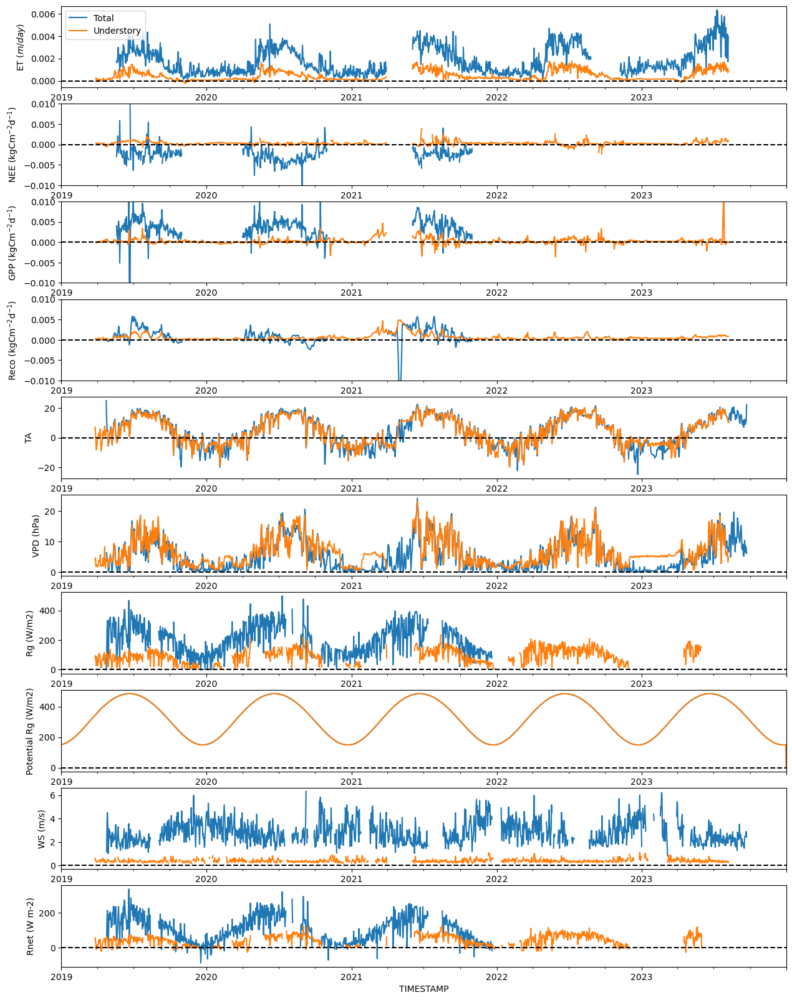

In [36]:
### understory
flux_uf_under = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-UF-3m_proc_.tsv')
compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-UF-3m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-UF-3m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-UF-3m_Rnet.csv'), 
)
compare["Rg"] = compare["Rg"].where((compare["Rg"] > 0) & (compare["Rg"] < 5000))
compare["Rnet"] = compare["Rnet"].where((compare["Rnet"] > -500) & (compare["Rnet"] < 2000))

flux_uf_under["NEE"] = np.where(flux_uf_under["NEE"].abs() > 0.03, np.nan, flux_uf_under["NEE"])
flux_uf_under["GPP"] = np.where(flux_uf_under["NEE"].abs() > 0.03, np.nan, flux_uf_under["GPP"])
flux_uf_under["Reco"] = np.where(flux_uf_under["NEE"].abs() > 0.03, np.nan, flux_uf_under["Reco"])

flux_uf_under = flux_uf_under.merge(compare, left_index=True, right_index=True, how="outer")


# ecosystem
flux_uf = (
    flux_nf
    .merge(flux_uf_under, how="inner", left_index=True, right_index=True, suffixes=("_nf", "_uf_under"))
    .merge(flux_nf_under.rename(columns=dict(ET="ET_nf_under", NEE="NEE_nf_under", GPP="GPP_nf_under", Reco="Reco_nf_under", TA="TA_nf_under", VPD="VPD_nf_under")), how="inner", left_index=True, right_index=True)
)
flux_uf["ET"] = flux_uf["ET_nf"] - flux_uf["ET_nf_under"] + flux_uf["ET_uf_under"]
flux_uf["NEE"] = flux_uf["NEE_nf"] - flux_uf["NEE_nf_under"] + flux_uf["NEE_uf_under"]
flux_uf["GPP"] = flux_uf["GPP_nf"] - flux_uf["GPP_nf_under"] + flux_uf["GPP_uf_under"]
flux_uf["Reco"] = flux_uf["Reco_nf"] - flux_uf["Reco_nf_under"] + flux_uf["Reco_uf_under"]
flux_uf["VPD"] = flux_uf["VPD_nf"]
flux_uf["Rg"] = flux_uf["Rg_nf"]
flux_uf["Rnet"] = flux_uf["Rnet_nf"]
flux_uf["PotRad"] = flux_uf["PotRad_nf"]
flux_uf["WS"] = flux_uf["WS_nf"]
flux_uf["TA"] = flux_uf["TA_nf"]
flux_uf = flux_uf[["ET", "NEE", "GPP", "Reco", "VPD", "Rg", "Rnet", "PotRad", "WS", "TA"]]



fig, axs = plt.subplots(10, 1, figsize=(15, 20))

(flux_uf.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);
(flux_uf_under.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);

(flux_uf.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_uf_under.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_uf.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_uf_under.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_uf.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));
(flux_uf_under.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));

flux_uf.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);
flux_uf_under.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);

flux_uf.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);
flux_uf_under.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);

flux_uf.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (W/m2)", ax=axs[6], legend=False);
flux_uf_under.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (W/m2)", ax=axs[6], legend=False);

flux_uf.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Potential RG (W/m2)", ax=axs[7], legend=False);
flux_uf_under.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Potential Rg (W/m2)", ax=axs[7], legend=False);

flux_uf.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (m/s)", ax=axs[8], legend=False);
flux_uf_under.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (m/s)", ax=axs[8], legend=False);

flux_uf.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);
flux_uf_under.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);

axs[0].legend(["Total", "Understory", "Canopy"])

for ax in axs:
    ax.hlines(0, *ax.get_xlim(), "k", "--")

In [37]:
uf_data = flux_uf.merge(soil_uf, left_index=True, right_index=True, how="inner")
uf_data.to_csv("./UF_data.csv")

uf_under_data = flux_uf_under.merge(soil_uf, left_index=True, right_index=True, how="inner")
uf_under_data.to_csv("./UF_understory_data.csv")

## BB-SF

100%|██████████| 104060/104060 [07:16<00:00, 238.36it/s]


A
B
C
D


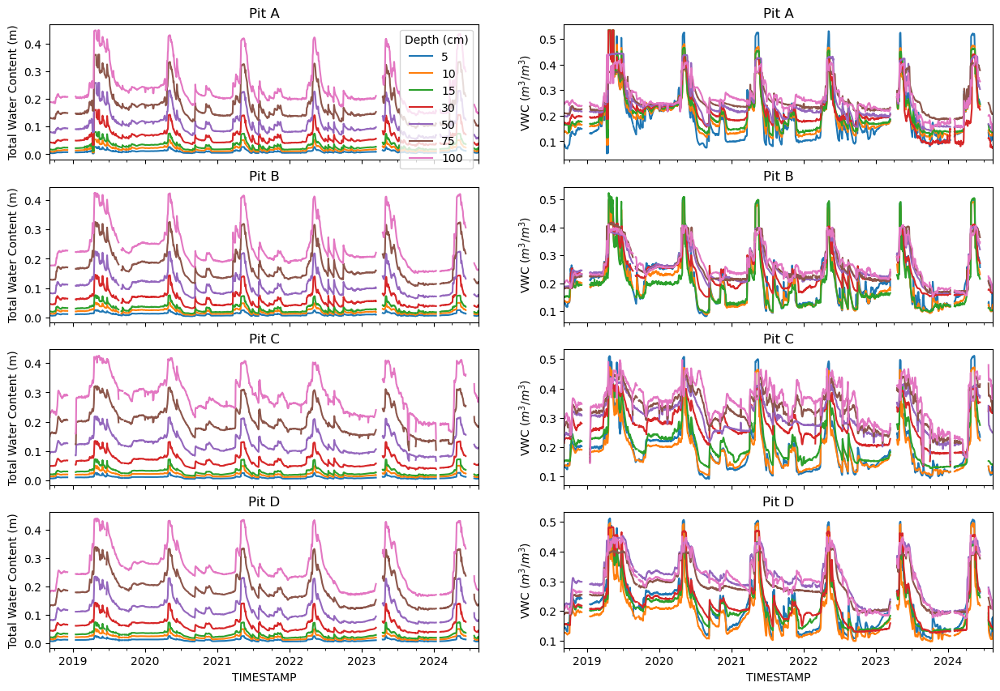

In [38]:
soil_data_dir = Path("/project/bbtrees/afox18/CP_Compound_Disturbance/soil-water-budget")
tdr_file = soil_data_dir / Path("TDR_v1_2_2018to2024_FINAL.csv")
dfs = []

tdr = pd.read_csv(tdr_file, skiprows=[1])
tdr["TIMESTAMP"] = pd.to_datetime(
    tdr["Year"].astype(str) 
    + "-" + tdr["Month"].astype(str) 
    + "-" + tdr["Day"].astype(str) 
    + " " + tdr["Hour"].astype(str) 
    + ":" + tdr["Min"].astype(str)
)

tdr = (
    tdr
    .filter(regex="^SWC_[ABCD]_[0-9]+cm|TIMESTAMP")
    .rename(columns={
        "SWC_A_05cm":"VWC_A-5",
        "SWC_A_10cm":"VWC_A-10",
        "SWC_A_15cm":"VWC_A-15",
        "SWC_A_30cm":"VWC_A-30",
        "SWC_A_50cm":"VWC_A-50",
        "SWC_A_75cm":"VWC_A-75",
        "SWC_B_05cm":"VWC_B-5",
        "SWC_B_10cm":"VWC_B-10",
        "SWC_B_15cm":"VWC_B-15",
        "SWC_B_30cm":"VWC_B-30",
        "SWC_B_50cm":"VWC_B-50",
        "SWC_B_75cm":"VWC_B-75",
        "SWC_C_05cm":"VWC_C-5",
        "SWC_C_10cm":"VWC_C-10",
        "SWC_C_15cm":"VWC_C-15",
        "SWC_C_30cm":"VWC_C-30",
        "SWC_C_50cm":"VWC_C-50",
        "SWC_C_75cm":"VWC_C-75",
        "SWC_D_05cm":"VWC_D-5",
        "SWC_D_10cm":"VWC_D-10",
        "SWC_D_15cm":"VWC_D-15",
        "SWC_D_30cm":"VWC_D-30",
        "SWC_D_50cm":"VWC_D-50",
        "SWC_D_75cm":"VWC_D-75",
    })
)

soil_sf = (
    tdr
    .sort_values("TIMESTAMP")
    .drop_duplicates(subset="TIMESTAMP")
    .set_index("TIMESTAMP")
    .interpolate(limit=48*7)
)

soil_sf = soil_sf.reset_index().sort_values("TIMESTAMP").set_index("TIMESTAMP")

# filter for field capacity + realistic values
theta_s = soil_sf.filter(regex="VWC").quantile([0.97]).max(1).values[0]
field_capacity = theta_s*0.82

pits = sorted(list(set([c.split("_")[-1][0] for c in soil_sf.columns])))
soil_sf = extrapolate_vwc(soil_sf, depths=[5, 10, 15, 30, 50, 75], pits=pits, method="power")
soil_sf = soil_sf.loc[~soil_sf.index.isna()]

depths = [5, 10, 15, 30, 50, 75, 100]
soil_sf = compute_s(soil_sf, depths, pits, field_capacity)

h_sf = soil_sf.filter(regex=f"h_[ABCD]-[0-9]+$").copy()
vwc_sf = soil_sf.filter(regex=f"VWC_[ABCD]-[0-9]+$").copy()
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_sf.filter(regex=f"h_{pit}").groupby(pd.Grouper(freq="1d")).mean().plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")

    vwc_sf.filter(regex=f"VWC_{pit}").groupby(pd.Grouper(freq="1d")).mean().plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("VWC ($m^3/m^3$)")
    axs[i, 0].set_title(f"Pit {pit}")
    axs[i, 1].set_title(f"Pit {pit}")
axs[0, 0].legend(title="Depth (cm)", labels=depths);
    
soil_sf.to_csv("soil_sf.csv")

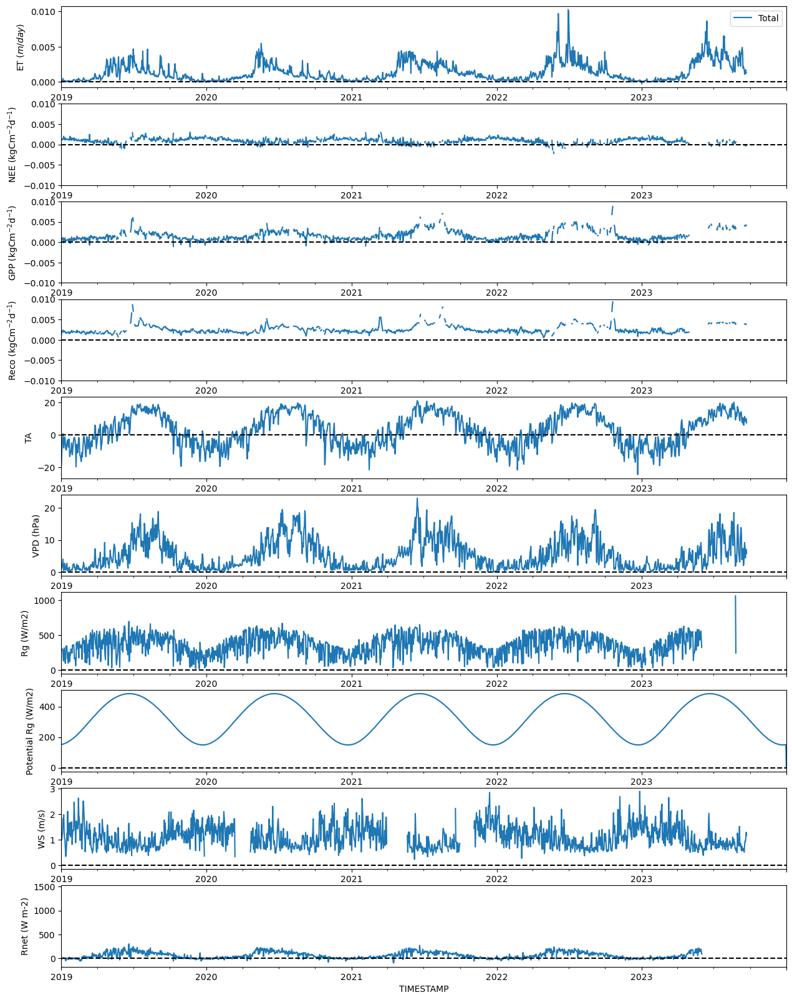

In [39]:
flux_sf = load_flux_data(Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-SF-4m_proc_.tsv')
flux_sf["NEE"] = flux_sf["NEE"].where(flux_sf["NEE"].abs() < 0.01)
flux_sf["GPP"] = flux_sf["GPP"].where(flux_sf["NEE"].abs() < 0.01)
flux_sf["Reco"] = flux_sf["Reco"].where(flux_sf["NEE"].abs() < 0.01)

compare = get_rg_ws(
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-SF-4m_eddypro_fullout.csv'), 
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all') / 'BB-SF-4m_proc_.tsv',
    Path('/project/bbtrees/afox18/EddyProConfigEditor/workflows/Postproc_all/BB-SF-4m_Rnet.csv'), 
)
compare["Rg"] = compare["Rg"].where((compare["Rg"] > 0) & (compare["Rg"] < 2000))
compare["Rnet"] = compare["Rnet"].where((compare["Rnet"] > -500) & (compare["Rnet"] < 2000))
flux_sf = flux_sf.merge(compare, left_index=True, right_index=True, how="outer")

fig, axs = plt.subplots(10, 1, figsize=(15, 20))

(flux_sf.filter(regex="ET").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel="ET ($m/day$)", ax=axs[0]);

(flux_sf.filter(regex="NEE").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[1], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_sf.filter(regex="GPP").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[2], legend=False, ylim=(-0.5/50, 0.5/50));

(flux_sf.filter(regex="Reco").groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ylabel=r"Reco ($\mathrm{kgC m^{-2} d^{-1}}$)", ax=axs[3], legend=False, ylim=(-0.5/50, 0.5/50));

flux_sf.filter(regex="TA").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="TA", ax=axs[4], legend=False);

flux_sf.filter(regex="VPD").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="VPD (hPa)", ax=axs[5], legend=False);

flux_sf.filter(regex="Rg").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rg (W/m2)", ax=axs[6], legend=False);

flux_sf.filter(regex="PotRad").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Potential Rg (W/m2)", ax=axs[7], legend=False);

flux_sf.filter(regex="WS").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="WS (m/s)", ax=axs[8], legend=False);

flux_sf.filter(regex="Rnet").groupby(pd.Grouper(freq="1d")).mean().plot(ylabel="Rnet (W m-2)", ax=axs[9], legend=False);

axs[0].legend(["Total", "Understory", "Canopy"])

for ax in axs:
    ax.hlines(0, *ax.get_xlim(), "k", "--")

In [40]:
sf_data = flux_sf.merge(soil_sf, left_index=True, right_index=True, how="inner")
sf_data.to_csv("SF_data.csv")

# Start here if using saved data

In [2]:
# load in data
nf_data = pd.read_csv("NF_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
nf_under_data = pd.read_csv("NF_understory_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
nf_can_data = pd.read_csv("NF_canopy_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")
uf_data = pd.read_csv("UF_data.csv", parse_dates=["TIMESTAMP"])
uf_data["TIMESTAMP"] = pd.to_datetime(uf_data["TIMESTAMP"], format="mixed")
uf_data = uf_data.drop_duplicates(subset="TIMESTAMP")
uf_data = uf_data.set_index("TIMESTAMP")
uf_under_data = pd.read_csv("UF_understory_data.csv", parse_dates=["TIMESTAMP"])
uf_under_data["TIMESTAMP"] = pd.to_datetime(uf_under_data["TIMESTAMP"], format="mixed")
uf_under_data = uf_under_data.set_index("TIMESTAMP")
sf_data = pd.read_csv("SF_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")

# make continuous
tmin = min([nf_data.index.min(), sf_data.index.min(), nf_under_data.index.min(), uf_under_data.index.min()])
tmax = max([nf_data.index.max(), sf_data.index.max(), nf_under_data.index.max(), uf_under_data.index.max()])
nf_data = make_timeseries_continuous(nf_data, tmin, tmax, "30min")
nf_can_data = make_timeseries_continuous(nf_can_data, tmin, tmax, "30min")
nf_under_data = make_timeseries_continuous(nf_under_data, tmin, tmax, "30min")
uf_data = make_timeseries_continuous(uf_data, tmin, tmax, "30min")
uf_under_data = make_timeseries_continuous(uf_under_data, tmin, tmax, "30min")
sf_data = make_timeseries_continuous(sf_data, tmin, tmax, "30min")

# gap filling
nf_data = cross_fill(["TA", "VPD"], nf_data, sf_data, nf_under_data, uf_under_data)
nf_can_data = cross_fill(["TA", "VPD"], nf_can_data, nf_data)
nf_under_data = cross_fill(["TA", "VPD"], nf_under_data, uf_under_data, nf_data)
uf_under_data = cross_fill(["TA", "VPD"], uf_under_data, nf_under_data)
sf_data = cross_fill(["TA", "VPD"], sf_data, nf_data)

nf_data = cross_fill(["Rnet"], nf_data, sf_data)
sf_data = cross_fill(["Rnet"], sf_data, nf_data)

nf_under_data = cross_fill(["Rnet", "WS"], nf_under_data, uf_under_data,)
uf_under_data = cross_fill(["Rnet", "WS"], uf_under_data, nf_under_data,)

# # prepping water storage data for drydown analysis
h_nf = cut_S_by_field_capacity(nf_data, "AC", quantile=1, scale=0.8)
h_nf_can = cut_S_by_field_capacity(nf_can_data, "AC", quantile=1, scale=0.8)
h_nf_under = cut_S_by_field_capacity(nf_under_data, "AC", quantile=1, scale=0.8)
h_uf = cut_S_by_field_capacity(uf_data, "ABC", quantile=1, scale=2)
h_uf_under = cut_S_by_field_capacity(uf_under_data, "ABC", quantile=1, scale=2)
h_sf = cut_S_by_field_capacity(sf_data, "ABCD", quantile=1, scale=0.8)

vwc_nf = nf_data.filter(regex="VWC")
vwc_nf_under = nf_under_data.filter(regex="VWC")
vwc_nf_can = nf_can_data.filter(regex="VWC")
vwc_uf = uf_data.filter(regex="VWC")
vwc_uf_under = uf_under_data.filter(regex="VWC")
vwc_sf = sf_data.filter(regex="VWC")

all_flux_columns = ["ET", "Reco", "GPP", "NEE", "VPD", "TA", "Rg", "Rnet", "PotRad", "WS"]
flux_nf = nf_data[all_flux_columns]
flux_nf_under = nf_under_data[all_flux_columns]
flux_nf_can = nf_can_data[all_flux_columns]
flux_uf = uf_data[all_flux_columns]
flux_uf_under = uf_under_data[all_flux_columns]
flux_sf = sf_data[all_flux_columns]

# Basic Plots

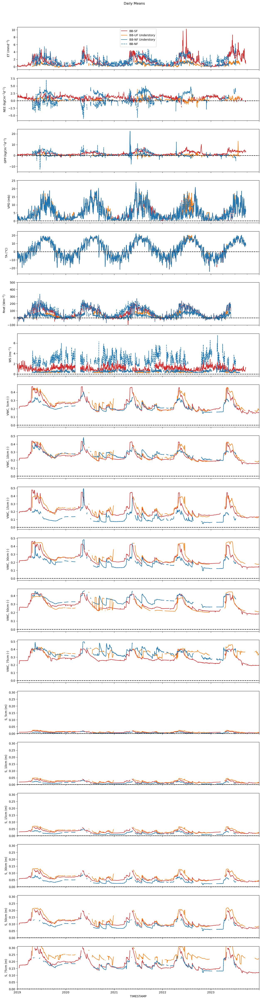

In [89]:
fig, axs = plt.subplots(19, 1, figsize=(15, 60), sharex="col", sharey="row")

fig.suptitle("Daily Means", y=0.9)

# ET
ax = axs[0]
(sf_data["ET"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3", label="BB-SF")
(uf_under_data["ET"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1", label="BB-UF Understory")
(nf_under_data["ET"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", label="BB-NF Understory")
(nf_data["ET"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--", label="BB-NF")
ax.set_ylabel(r"ET ($\mathrm{mm d^{-1}}$)")
ax.legend()

# NEE
ax = axs[1]
((sf_data["NEE"]*1000).groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ax=ax, color="C3")
((uf_under_data["NEE"]*1000).groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ax=ax, color="C1")
((nf_under_data["NEE"]*1000).groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ax=ax, color="C0")
((nf_data["NEE"]*1000).groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48).plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"NEE ($\mathrm{kgC m^{-2} d^{-1}}$)")

# GPP
ax = axs[2]
(sf_data["GPP"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
(uf_under_data["GPP"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
(nf_under_data["GPP"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
(nf_data["GPP"]*1000).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"GPP ($\mathrm{kgC m^{-2} d^{-1}}$)")

# VPD
ax = axs[3]
sf_data["VPD"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data["VPD"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data["VPD"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data["VPD"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VPD (mb)")

# TA
ax = axs[4]
sf_data["TA"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data["TA"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data["TA"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")

nf_data["TA"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"TA (°C)")

# Rnet
ax = axs[5]
sf_data["Rnet"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data["Rnet"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data["Rnet"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data["Rnet"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"Rnet ($\mathrm{W m^{-2}}$)")
ax.set_ylim(-100, 500)

# WS
ax = axs[6]
sf_data["WS"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data["WS"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data["WS"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data["WS"].groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"WS ($\mathrm{m s^{-1}}$)")

# VWC 5
ax = axs[7]
sf_data.filter(regex="^VWC_[ABCD]-5").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data.filter(regex="^VWC_[ABCD]-5").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data.filter(regex="^VWC_[ABCD]-5").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data.filter(regex="^VWC_[ABCD]-5").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VWC, 5cm (-)")

# VWC 10
ax = axs[8]
sf_data.filter(regex="^VWC_[ABCD]-10").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data.filter(regex="^VWC_[ABCD]-10").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data.filter(regex="^VWC_[ABCD]-10").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data.filter(regex="^VWC_[ABCD]-10").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VWC, 10cm (-)")

# VWC 15
ax = axs[9]
sf_data.filter(regex="^VWC_[ABCD]-15").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data.filter(regex="^VWC_[ABCD]-15").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data.filter(regex="^VWC_[ABCD]-15").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data.filter(regex="^VWC_[ABCD]-15").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VWC, 15cm (-)")

# VWC 30
ax = axs[10]
sf_data.filter(regex="^VWC_[ABCD]-30").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data.filter(regex="^VWC_[ABCD]-30").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data.filter(regex="^VWC_[ABCD]-30").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data.filter(regex="^VWC_[ABCD]-30").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VWC, 30cm (-)")

# VWC 50
ax = axs[11]
sf_data.filter(regex="^VWC_[ABCD]-50").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data.filter(regex="^VWC_[ABCD]-50").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data.filter(regex="^VWC_[ABCD]-50").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data.filter(regex="^VWC_[ABCD]-50").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VWC, 50cm (-)")

# VWC 75
ax = axs[12]
sf_data.filter(regex="^VWC_[ABCD]-75").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
uf_under_data.filter(regex="^VWC_[ABCD]-75").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
nf_under_data.filter(regex="^VWC_[ABCD]-75").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
nf_data.filter(regex="^VWC_[ABCD]-75").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"VWC, 75cm (-)")

# S 5
ax = axs[13]
h_sf.filter(regex="^h_[ABCD]-5$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
h_uf_under.filter(regex="^h_[ABCD]-5$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
h_nf_under.filter(regex="h_[ABCD]-5$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
h_nf.filter(regex="^h_[ABCD]-5$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel("S, 5cm (m)")
ax.set_ylim(0, 0.31)

# S 10
ax = axs[14]
h_sf.filter(regex="^h_[ABCD]-10$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
h_uf_under.filter(regex="^h_[ABCD]-10$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
h_nf_under.filter(regex="^h_[ABCD]-10$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
h_nf.filter(regex="^h_[ABCD]-10$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"S, 10cm (m)")
ax.set_ylim(0, 0.31)

# S 15
ax = axs[15]
h_sf.filter(regex="^h_[ABCD]-15$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
h_uf_under.filter(regex="^h_[ABCD]-15$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
h_nf_under.filter(regex="^h_[ABCD]-15$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
h_nf.filter(regex="^h_[ABCD]-15$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"S, 15cm (m)")
ax.set_ylim(0, 0.31)

# S 30
ax = axs[16]
h_sf.filter(regex="^h_[ABCD]-30$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
h_uf_under.filter(regex="^h_[ABCD]-30$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
h_nf_under.filter(regex="^h_[ABCD]-30$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
h_nf.filter(regex="^h_[ABCD]-30$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"S, 30cm (m)")
ax.set_ylim(0, 0.31)

# S 50
ax = axs[17]
h_sf.filter(regex="^h_[ABCD]-50$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
h_uf_under.filter(regex="^h_[ABCD]-50$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
h_nf_under.filter(regex="^h_[ABCD]-50$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
h_nf.filter(regex="^h_[ABCD]-50$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"S, 50cm (m)")
ax.set_ylim(0, 0.31)

# S 75
ax = axs[18]
h_sf.filter(regex="^h_[ABCD]-75$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C3")
h_uf_under.filter(regex="^h_[ABCD]-75$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C1")
h_nf_under.filter(regex="^h_[ABCD]-75$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0")
h_nf.filter(regex="^h_[ABCD]-75$").mean(1).groupby(pd.Grouper(freq="1d")).mean().plot(ax=ax, color="C0", linestyle="--")
ax.hlines(0, *ax.get_xlim(), "k", "--")
ax.set_ylabel(r"S, 75cm (m)")
ax.set_ylim(0, 0.31)

pass;

# Computing $\Delta S$


Compute $\Delta \theta_i$ and $ET_{\text{total}, i}$: 

* set $i = 0$
* for each timepoint $t$:
  * At the start of a run, record the starting $t$: if $\theta_{t-1} = \text{NaN}$ and $\theta_{t} \neq \text{NaN}$, record $\text{start}_i = t$
  * At the end of a run, record the ending $t$ and increment $i$: if $\theta_{t} \neq \text{NaN}$ and $\theta_{t+1} = \text{NaN}$, set $\text{end}_i = t$, then increment $i$ by 1. 
* for each block $i$:
  * compute $\Delta \theta_i = \theta_{\text{end}_i} - \theta_{\text{start}_i}$
  * compute $ET_{\text{total}, i} = \sum_{t=\text{start}_i}^{\text{end}_i} \text{ET}_t$
* Compute soil moisture storage change by using trapezoidal rule

In [90]:
def compute_deltas(s_daily, et_daily, max_width=14):
    """
    Identifies the loss of soil moisture and total evapotranspiration for each contiguous (unbroken) block of soil moisture data in the dataset. If the data has been run through filter_rain_events, then each contiguous block is said to represent one "dry-down event."

    s_daily, et_daily: dataframes containing soil water storage and ET timeseries data, respectively. Must have identical indexes.
    max_width: the maximum allowable length of a given drydown event, in days. Events longer than max_width will be chopped up into even sized chunks.

    Returns: a containing the start date, end date, total soil moisture loss, and total ET for each dry-down event.
    """     
    # compute start/end indices
    runs = {}
    # max_len = (0, None, None)
    # max_c = None
    for c in s_daily:
        x = s_daily[c].values
        i = 0
        starts = []
        ends = []
        runlen = 0
        running = False
        for ti in range(1, x.shape[0] - 1): 
            # detect when we leave a region of nans, record the start of a run
            if np.isnan(x[ti - 1]) and ~np.isnan(x[ti]):
                starts.append(ti)
                running = True
                runlen = 0
                # print(f"Starting a run at {s_daily.index.date[ti]}")
            
            # split a run if we reach max width
            if runlen == max_width and ~np.isnan(x[ti]):
                x[ti + 1] = np.nan
                # print(f"Cutting a run short at {s_daily.index.date[ti+1]}")
            
            # detect when we are about to enter a region of nans, record the end of a run
            if ~np.isnan(x[ti]) and np.isnan(x[ti + 1]):
                ends.append(ti)
                running = False
                # print(f"Ending a run at {s_daily.index.date[ti]}, length {runlen}")
            
            # increment the runlength if appropriate
            if running: runlen += 1
            else: runlen = 0
           
                
        if len(starts) > len(ends):
            ends.append(ti)
        runs[c] = (starts, ends)

    # compute delta-h for each dry-down event
    delta_s = {}
    t = {}
    te = {}
    for k, v in runs.items():
        dh = []
        ts = []
        tes = []
        for s, e in zip(*v):
            h_end = s_daily[k].iloc[e]
            h_start = s_daily[k].iloc[s]
            ts.append(s_daily[k].index[s])
            tes.append(s_daily[k].index[e])
            dh.append(h_end - h_start)
        delta_s[k] = dh
        t[k] = ts
        te[k] = tes
    
    # compute total ET for each dry-down event
    total_et = {}
    for k, v in runs.items():
        total_et[k] = [et_daily.iloc[s:e].sum(skipna=False).iloc[0] for s, e in zip(*v)]

    # create dataframe of dry-down fluxes
    depth_lst = []
    pit_lst = []
    total_et_lst = []
    delta_s_lst = []
    t_lst = []
    te_lst = []
    for k in delta_s:
        n = len(total_et[k])
        pit_lst.extend([k[2:].split("-")[0]]*n)
        depth_lst.extend([int(k.split("-")[-1])]*n)
        total_et_lst.extend(total_et[k])
        delta_s_lst.extend(delta_s[k])
        t_lst.extend(t[k])
        te_lst.extend(te[k])
    drydown_fluxes = pd.DataFrame(dict(z=depth_lst, pit=pit_lst, et=total_et_lst, delta_s=delta_s_lst, t_start=t_lst, t_end=te_lst))
    
    return drydown_fluxes

In [93]:
h_nf_daily = h_nf.groupby(pd.Grouper(freq="1d")).mean()
flux_nf_daily = flux_nf.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_nf_daily_filtered = filter_rain_events(h_nf_daily)
drydown_fluxes_nf = compute_deltas(h_nf_daily_filtered, flux_nf_daily, max_width=21)

h_nf_under_daily = h_nf_under.groupby(pd.Grouper(freq="1d")).mean()
flux_nf_under_daily = flux_nf_under.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_nf_under_daily_filtered = filter_rain_events(h_nf_under_daily)
drydown_fluxes_nf_under = compute_deltas(h_nf_under_daily_filtered, flux_nf_under_daily, max_width=21)

h_nf_can_daily = h_nf_can.groupby(pd.Grouper(freq="1d")).mean()
flux_nf_can_daily = flux_nf_can.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_nf_can_daily_filtered = filter_rain_events(h_nf_can_daily)
drydown_fluxes_nf_can = compute_deltas(h_nf_can_daily_filtered, flux_nf_can_daily, max_width=21)

h_uf_daily = h_uf.groupby(pd.Grouper(freq="1d")).mean()
flux_uf_daily = flux_uf.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_uf_daily_filtered = filter_rain_events(h_uf_daily)
drydown_fluxes_uf = compute_deltas(h_uf_daily_filtered, flux_uf_daily)

h_uf_under_daily = h_uf_under.groupby(pd.Grouper(freq="1d")).mean()
flux_uf_under_daily = flux_uf_under.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_uf_under_daily_filtered = filter_rain_events(h_uf_under_daily)
drydown_fluxes_uf_under = compute_deltas(h_uf_under_daily_filtered, flux_uf_under_daily, max_width=21)

h_sf_daily = h_sf.groupby(pd.Grouper(freq="1d")).mean()
flux_sf_daily = flux_sf.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48
h_sf_daily_filtered = filter_rain_events(h_sf_daily)
drydown_fluxes_sf = compute_deltas(h_sf_daily_filtered, flux_sf_daily, max_width=21)

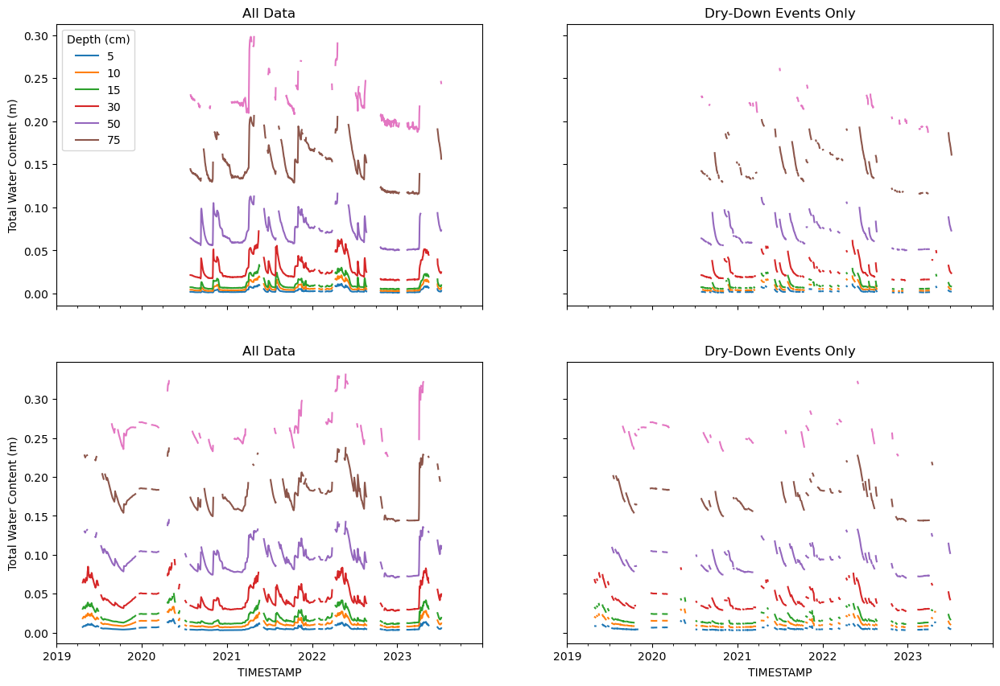

In [94]:
pits = "AC"
b_depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col", sharey="row")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_nf_daily.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")
    axs[i,0].set_title("All Data")
    
    h_nf_daily_filtered.filter(regex=f"h_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("")
    axs[i, 1].set_title("Dry-Down Events Only")
axs[0, 0].legend(title="Depth (cm)", labels=b_depths);

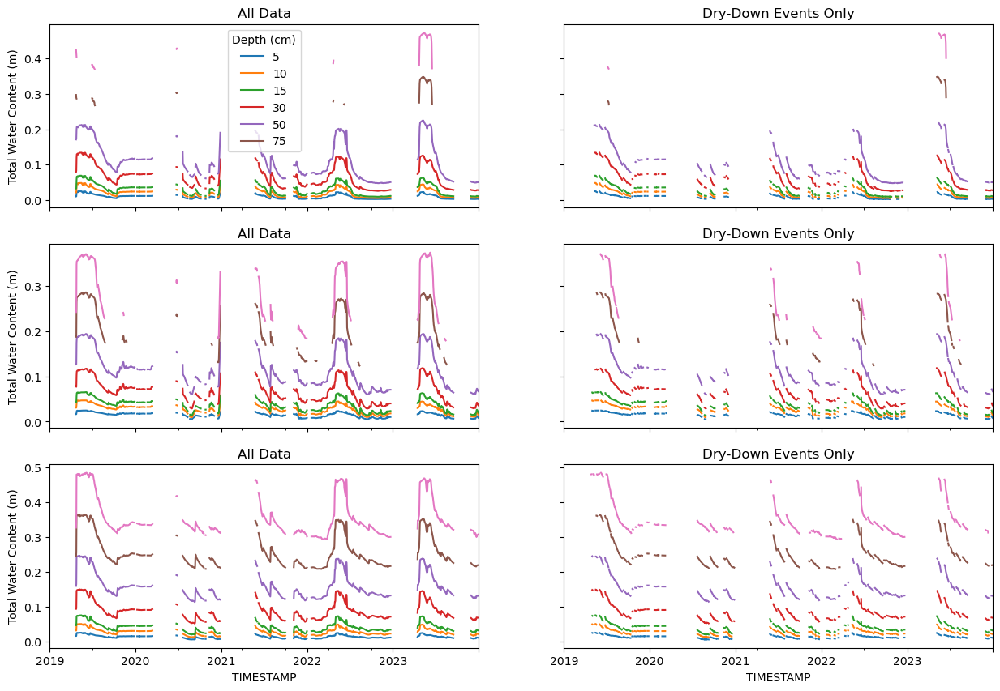

In [95]:
pits = "ABC"
b_depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col", sharey="row")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_uf_daily.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")
    axs[i,0].set_title("All Data")
    
    h_uf_daily_filtered.filter(regex=f"h_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("")
    axs[i, 1].set_title("Dry-Down Events Only")
    
axs[0, 0].legend(title="Depth (cm)", labels=b_depths);

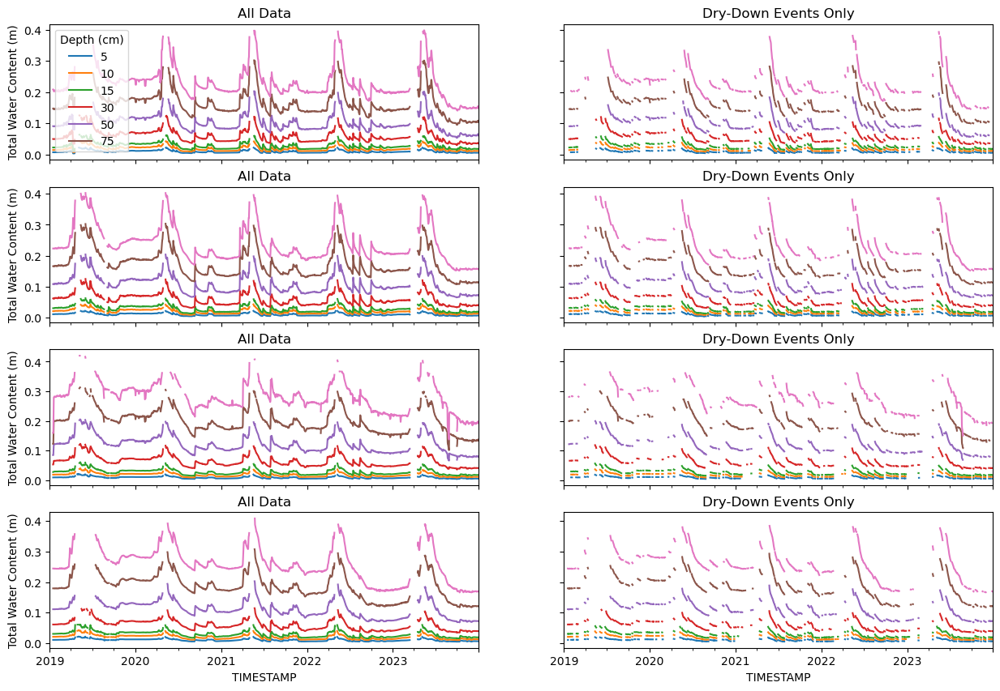

In [96]:
pits = "ABCD"
b_depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(len(pits), 2, figsize=(15,10), sharex="col", sharey="row")
axs = np.atleast_1d(axs)
for i, pit in enumerate(pits):
    h_sf_daily.filter(regex=f"h_{pit}").plot(ax=axs[i, 0], legend=False)
    axs[i, 0].set_ylabel("Total Water Content (m)")
    axs[i,0].set_title("All Data")
    
    h_sf_daily_filtered.filter(regex=f"h_{pit}").plot(ax=axs[i, 1], legend=False)
    axs[i, 1].set_ylabel("")
    axs[i, 1].set_title("Dry-Down Events Only")
axs[0, 0].legend(title="Depth (cm)", labels=b_depths);

Make some rough correlation plots

## Combine into a single dataframe

Processing notes:
* exclude all negative soil moisture gains
* exclude all "small" soil moisture fluxes. The reasoning behind this is threefold:
    * these small events could be due to soil water flow, and not due to evapotranspiration. The reasoning behind this is that we see *no* ET response for these small soil fluxes.
    * these events are part of a series of multiple small inputs in rapid succession, such as daily snowmelt inputs. In these cases, there likely isn't enough time for the ecosystem ET to repond in between events.
    * These are due to noise in the soil moisture probe readings.

In [97]:
drydown_fluxes_nf["Site"] = "NF"
drydown_fluxes_nf["Height"] = "Ecosystem"

drydown_fluxes_nf_under["Site"] = "NF"
drydown_fluxes_nf_under["Height"] = "Understory"

drydown_fluxes_nf_can["Site"] = "NF"
drydown_fluxes_nf_can["Height"] = "Canopy"

drydown_fluxes_uf["Site"] = "UF"
drydown_fluxes_uf["Height"] = "Ecosystem"

drydown_fluxes_uf_under["Site"] = "UF"
drydown_fluxes_uf_under["Height"] = "Understory"

drydown_fluxes_sf["Site"] = "SF"
drydown_fluxes_sf["Height"] = "Understory"

drydown_fluxes = pd.concat([drydown_fluxes_nf, drydown_fluxes_nf_under, drydown_fluxes_nf_can, drydown_fluxes_uf, drydown_fluxes_uf_under, drydown_fluxes_sf])

drydown_fluxes["et"] = drydown_fluxes["et"]*1000
drydown_fluxes["delta_s"] = -drydown_fluxes["delta_s"]*1000
drydown_fluxes["excess_et"] = drydown_fluxes["et"] - drydown_fluxes["delta_s"]

drydown_fluxes = drydown_fluxes.query("delta_s > 0").copy()

q = 0.3
delta_s_thresholds = (
    drydown_fluxes
    .groupby(["Site", "Height", "pit", "z"])[["delta_s"]]
    .quantile(q)
    .reset_index()
)
drydown_fluxes = (
    drydown_fluxes
    .merge(delta_s_thresholds, on=["Site", "Height", "pit", "z"], how="inner", suffixes=["", "_threshold"])
)

drydown_fluxes = drydown_fluxes.where(drydown_fluxes["delta_s"] > drydown_fluxes["delta_s_threshold"])
drydown_fluxes = drydown_fluxes.dropna()
drydown_fluxes.to_pickle("drydown_fluxes.pickle")

Compute drydown fluxes, but only using *daytime* ET

# Regressions

## Check that independent variables are not correlated

In [ ]:
corr_test = drydown_fluxes.copy()
corr_test["year"] = corr_test.t_start.dt.year
corr_test["month"] = corr_test.t_start.dt.month
corr_test["pit"] = pd.factorize(corr_test["pit"])[0]
corr_test["Site"] = pd.factorize(corr_test["Site"])[0]
corr_test["Height"] = pd.factorize(corr_test["Height"])[0]

corr_test[["delta_s", "z", "pit", "Site", "Height", "year", "month"]].corr()

def make_pretty(styler):
    styler.set_caption("Correlation between Soil Moisture Losses and ET by Depth")
    styler.format(lambda v: np.round(v,2))
    styler.background_gradient(axis=None, vmin=0, vmax=0.7, cmap="Blues")
    return styler
display((corr_test[["delta_s", "z", "pit", "Site", "Height", "year", "month"]].corr()**2).style.pipe(make_pretty))

## Understory

In [12]:
m = ols("et ~ delta_s*C(z)*C(Site)", data=drydown_fluxes.query("Height == 'Understory' and z <= 50")).fit()
m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     et   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                     53.41
Date:                Tue, 21 Jan 2025   Prob (F-statistic):          1.78e-184
Time:                        13:51:13   Log-Likelihood:                -4045.4
No. Observations:                1088   AIC:                             8151.
Df Residuals:                    1058   BIC:                             8301.
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              1.7388      1.592      1.093      0.275      -1.384       4.862
C(z)[T.10.0]                          -0.0642      2.369     -0.027      0.978      -4.713       4.585
C(z)[T.15.0]                          -0.5056      2.364     -0.214      0.831      -5.144       4.133
C(z)[T.30.0]                          -0.8563      2.460     -0.348      0.728      -5.683       3.971
C(z)[T.50.0]                          -2.2192      4.459     -0.498      0.619     -10.970       6.531
C(Site)[T.SF]                          0.6277      1.974      0.318      0.751      -3.246       4.502
C(Site)[T.UF]                         -0.5564      2.554     -0.218      0.828      -5.568       4.455
C(z)[T.10.0]:C(Site)[T.SF]             0.4200      2.876      0.146      0.884      -5.222       6.062
C(z)[T.15.0]:C(Site)[T.SF]             1.9202      2.914      0.659      0.510      -3.797       7.638
C(z)[T.30.0]:C(Site)[T.SF]             2.0889      3.173      0.658      0.510      -4.138       8.315
C(z)[T.50.0]:C(Site)[T.SF]             4.0894      5.075      0.806      0.421      -5.868      14.047
C(z)[T.10.0]:C(Site)[T.UF]             0.5799      3.815      0.152      0.879      -6.906       8.066
C(z)[T.15.0]:C(Site)[T.UF]             0.9521      3.738      0.255      0.799      -6.383       8.287
C(z)[T.30.0]:C(Site)[T.UF]             0.5398      4.229      0.128      0.898      -7.758       8.838
C(z)[T.50.0]:C(Site)[T.UF]             0.9285      5.451      0.170      0.865      -9.768      11.625
delta_s                                4.7923      0.956      5.013      0.000       2.916       6.668
delta_s:C(z)[T.10.0]                  -2.1816      1.089     -2.003      0.045      -4.319      -0.045
delta_s:C(z)[T.15.0]                  -3.0007      1.016     -2.952      0.003      -4.995      -1.006
delta_s:C(z)[T.30.0]                  -3.8861      0.978     -3.973      0.000      -5.806      -1.967
delta_s:C(z)[T.50.0]                  -3.9746      0.995     -3.994      0.000      -5.928      -2.022
delta_s:C(Site)[T.SF]                  2.7417      1.049      2.613      0.009       0.683       4.801
delta_s:C(Site)[T.UF]                 -2.2411      1.189     -1.884      0.060      -4.575       0.092
delta_s:C(z)[T.10.0]:C(Site)[T.SF]    -1.2945      1.194     -1.084      0.278      -3.637       1.048
delta_s:C(z)[T.15.0]:C(Site)[T.SF]    -1.4658      1.121     -1.308      0.191      -3.665       0.734
delta_s:C(z)[T.30.0]:C(Site)[T.SF]    -1.6083      1.082     -1.487      0.137      -3.731       0.514
delta_s:C(z)[T.50.0]:C(Site)[T.SF]    -2.1478      1.106     -1.943      0.052      -4.317       0.022
delta_s:C(z)[T.10.0]:C(Site)[T.UF]     0.9462      1.361      0.695      0.487      -1.724      

We find that there is significant interaction between treatment and depth: the soil water extraction efficiency (slope of the $\Sum ET ~ \Delta S$ curve) changes with depth differently between the two treatments.

In [13]:
site_uf_terms = {}
for z in [5, 10, 15, 30, 50, 75, 100]:
    m = ols("et ~ delta_s*Site", data=drydown_fluxes.query("Height == 'Understory' and z == @z")).fit()
    site_uf_terms[z] = m.params["delta_s:Site[T.UF]"]
    # print(z)
    # display(m.summary().tables[1])

depth_terms = {}
for site in ["NF", "UF"]:
    m = ols("et ~ delta_s*z", data=drydown_fluxes.query("Height == 'Understory' and Site == @site and z <= 50")).fit()
    depth_terms[site] = m.params["delta_s:z"]

print("Effect of Treatment (UF) at each soil depth (units of mm Understory ET / mm ΔS")
for k, v in site_uf_terms.items():
    print(f"≤{k}cm: {v:.3f}")
print()

print("Effect of Depth at each treatment (units of mm Understory ET / mm ΔS / m depth")
for k, v in depth_terms.items():
    print(f"{k}: {v*100:.2f}")
# depth_terms  # units of 1/cm
# site_uf_terms

Effect of Treatment (UF) at each soil depth (units of mm Understory ET / mm ΔS
≤5cm: -2.241
≤10cm: -1.295
≤15cm: -0.783
≤30cm: 0.024
≤50cm: -0.023
≤75cm: 0.072
≤100cm: 0.217

Effect of Depth at each treatment (units of mm Understory ET / mm ΔS / m depth
NF: -2.82
UF: -0.98


## Whole ecosystem

In [14]:
m = ols("et ~ delta_s*C(z)*C(Site)", data=drydown_fluxes.query("Height == 'Ecosystem' and z <= 50")).fit()
m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     et   R-squared:                       0.501
Model:                            OLS   Adj. R-squared:                  0.478
Method:                 Least Squares   F-statistic:                     22.23
Date:                Tue, 21 Jan 2025   Prob (F-statistic):           5.11e-52
Time:                        13:51:16   Log-Likelihood:                -1918.5
No. Observations:                 441   AIC:                             3877.
Df Residuals:                     421   BIC:                             3959.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              7.7495      2.988      2.594      0.010       1.877      13.622
C(z)[T.10.0]                          -0.1060      4.477     -0.024      0.981      -8.905       8.693
C(z)[T.15.0]                          -1.4855      4.466     -0.333      0.740     -10.264       7.293
C(z)[T.30.0]                          -3.2389      4.649     -0.697      0.486     -12.378       5.900
C(z)[T.50.0]                          -7.7937      8.457     -0.922      0.357     -24.417       8.830
C(Site)[T.UF]                         -5.2613      5.116     -1.028      0.304     -15.318       4.795
C(z)[T.10.0]:C(Site)[T.UF]             0.9983      7.495      0.133      0.894     -13.735      15.731
C(z)[T.15.0]:C(Site)[T.UF]             2.7937      7.426      0.376      0.707     -11.803      17.390
C(z)[T.30.0]:C(Site)[T.UF]             0.5714      8.532      0.067      0.947     -16.199      17.342
C(z)[T.50.0]:C(Site)[T.UF]             4.0200     10.769      0.373      0.709     -17.147      25.187
delta_s                               13.8202      1.808      7.643      0.000      10.266      17.375
delta_s:C(z)[T.10.0]                  -6.1376      2.062     -2.976      0.003     -10.191      -2.084
delta_s:C(z)[T.15.0]                  -8.5510      1.923     -4.446      0.000     -12.332      -4.770
delta_s:C(z)[T.30.0]                 -11.0975      1.851     -5.996      0.000     -14.735      -7.460
delta_s:C(z)[T.50.0]                 -11.3646      1.883     -6.035      0.000     -15.066      -7.663
delta_s:C(Site)[T.UF]                 -4.3102      2.280     -1.891      0.059      -8.791       0.171
delta_s:C(z)[T.10.0]:C(Site)[T.UF]     1.2138      2.617      0.464      0.643      -3.930       6.358
delta_s:C(z)[T.15.0]:C(Site)[T.UF]     2.4664      2.446      1.008      0.314      -2.341       7.274
delta_s:C(z)[T.30.0]:C(Site)[T.UF]     4.8402      2.414      2.005      0.046       0.095       9.586
delta_s:C(z)[T.50.0]:C(Site)[T.UF]     4.3644      2.381      1.833      0.068      -0.316       9.045
==============================================================================
Omnibus:                      128.034   Durbin-Watson:                   1.633
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              293.831
Skew:                           1.492   Prob(JB):                     1.57e-64
Kurtosis:                       5.663   Cond. No.                         142.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

*There **is** a significant interaction of slopes between depth and treatment for the whole ecosystem!*

Therefore, we need to look at the affect of treatment for each depth and vice-versa

In [15]:
site_uf_terms = {}
for z in [5, 10, 15, 30, 50, 75, 100]:
    m = ols("et ~ delta_s*Site", data=drydown_fluxes.query("Height == 'Ecosystem' and z == @z")).fit()
    site_uf_terms[z] = m.params["delta_s:Site[T.UF]"]
    # print(z)
    # display(m.summary().tables[1])

depth_terms = {}
for site in ["NF", "UF"]:
    m = ols("et ~ delta_s*z", data=drydown_fluxes.query("Height == 'Ecosystem' and Site == @site and z <= 50")).fit()
    depth_terms[site] = m.params["delta_s:z"]

print("Effect of Treatment (UF) at each soil depth (units of mm Ecosystem ET / mm Δθ")
for k, v in site_uf_terms.items():
    print(f"≤{k}cm: {v:.3f}")
print()

print("Effect of Depth at each treatment (units of mm Ecosystem ET / mm Δθ / m depth")
for k, v in depth_terms.items():
    print(f"{k}: {v*100:.2f}")
# depth_terms  # units of 1/cm
# site_uf_terms

Effect of Treatment (UF) at each soil depth (units of mm Ecosystem ET / mm Δθ
≤5cm: -4.310
≤10cm: -3.096
≤15cm: -1.844
≤30cm: 0.530
≤50cm: 0.054
≤75cm: 0.362
≤100cm: 0.883

Effect of Depth at each treatment (units of mm Ecosystem ET / mm Δθ / m depth
NF: -8.25
UF: -4.25


With this significant interaction term, we notice two things when stratifying by our predictors:

* The smallest effect of treatment on the understory flux/soil moisture relationship occurs in the mid layers of soil, whereas the strongest difference occurs in the shallow (<5cm) soil depths (interpretation: I attribute this to to a more active understory in the UF treatment)
* The effect of depth is stronger in the NF treatment than at the UF treatment (interpretation: I attribute this to a stronger link at the surface in UF)

Now to put all this into a figure.

## Plots

In [16]:
from statsmxodels.sandbox.regression.predstd import wls_prediction_std

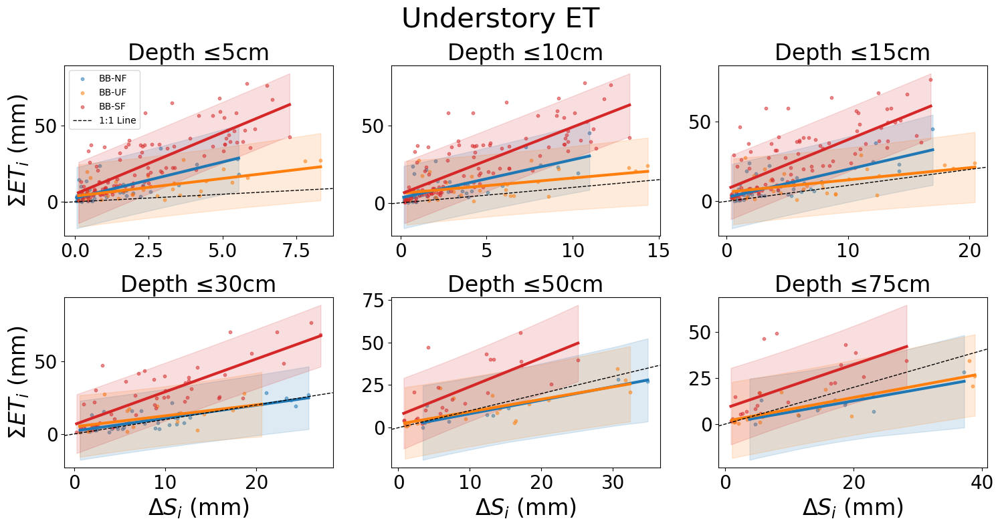

In [17]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and z <= 75")
    .copy()
    .dropna()
)
m = ols("et ~ delta_s*C(z)*C(Site)", data=df).fit()

df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15.07, 8))
axs = axs.flatten()

colors = {"NF":"C0", "UF":"C1", "SF":"C3"}
axs[3].set_xlabel("$\Delta S_i$ (mm)", size=24)
axs[4].set_xlabel("$\Delta S_i$ (mm)", size=24)
axs[5].set_xlabel("$\Delta S_i$ (mm)", size=24)
axs[0].set_ylabel("$\Sigma ET_i$ (mm)", size=24)
axs[3].set_ylabel("$\Sigma ET_i$ (mm)", size=24)

for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm", size=24)
    axs[i].tick_params(axis='both', which='major', labelsize=20)
    fig.suptitle("Understory ET", size=30)
    for site in ["NF", "UF", "SF"]:
        plot_df = df.query("z == @z and Site == @site").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=10, alpha=0.5, label=f"BB-{site}", color=colors[site])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], lw=3, color=colors[site])
        axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.15, color=colors[site])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1, label="1:1 Line")
    axs[i].set_xlim(xlim)

axs[0].legend()
plt.tight_layout(w_pad=1.4, h_pad=1.4)

plt.savefig("figs/understory_et_regression.png")

### Whole Ecosystem

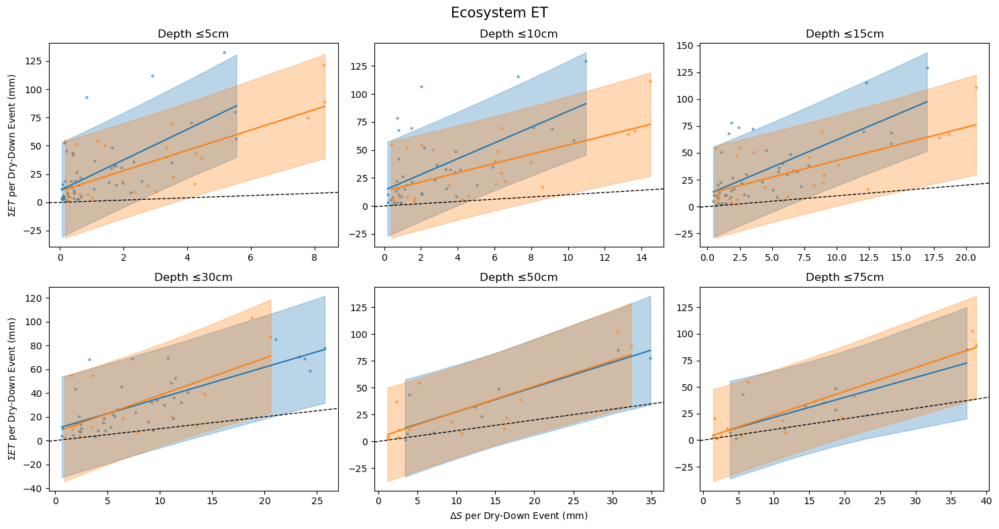

In [18]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Ecosystem' and z <= 75")
    .copy()
    .dropna()
)
m = ols("et ~ delta_s*C(z)*C(Site)", data=df).fit()

df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"NF":"C0", "UF":"C1"}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("$\Delta S$ per Dry-Down Event (mm)")
    axs[0].set_ylabel("$\Sigma ET$ per Dry-Down Event (mm)")
    axs[3].set_ylabel("$\Sigma ET$ per Dry-Down Event (mm)")
    fig.suptitle("Ecosystem ET", size=15)
    for site in ["NF", "UF"]:
        plot_df = df.query("z == @z and Site == @site").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site)
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"])
        axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[site])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

In [19]:
drydown_fluxes

,z,pit,et,delta_s,t_start,Site,Height,excess_et,delta_s_threshold
0,5.0,B,45.314251,0.201870,2020-07-30,NF,Ecosystem,45.112381,0.129826
1,5.0,B,32.280788,1.701042,2021-06-10,NF,Ecosystem,30.579746,0.129826
2,5.0,B,52.556211,0.139514,2021-07-11,NF,Ecosystem,52.416697,0.129826
3,5.0,B,111.673962,2.908681,2021-08-06,NF,Ecosystem,108.765281,0.129826
4,5.0,B,6.052132,0.198090,2021-12-17,NF,Ecosystem,5.854042,0.129826
...,...,...,...,...,...,...,...,...,...
3165,100.0,D,2.206439,1.276690,2022-10-07,SF,Understory,0.929749,1.147812
3166,100.0,D,4.835716,2.239121,2022-10-13,SF,Understory,2.596595,1.147812
3167,100.0,D,1.410882,1.151923,2022-11-20,SF,Understory,0.258959,1.147812
3169,100.0,D,0.401057,1.958479,2022-12-12,SF,Understory,-1.557422,1.147812


In [184]:
def compute_slopes(drydown_fluxes):
    sites = ["NF", "UF", "SF"]
    heights = ["Ecosystem", "Understory"]
    depths = [5, 10, 15, 30, 50, 75, 100]
    
    slope_dict = {
        ("Ecosystem", "NF"):[],
        ("Ecosystem", "UF"):[],
        ("Ecosystem", "SF"):[],
        ("Understory", "NF"):[],
        ("Understory", "UF"):[],
    }

    stderr_dict = {
        ("Ecosystem", "NF"):[],
        ("Ecosystem", "UF"):[],
        ("Ecosystem", "SF"):[],
        ("Understory", "NF"):[],
        ("Understory", "UF"):[],
    }
        
    for (h, s), z in itertools.product(slope_dict, depths):
        h_old = h
        if h == "Ecosystem" and s == "SF": h = "Understory"

        # avoid "pooling" in the springtime: limit SF analysis to June+
        if s == "SF": months = [7, 8, 9, 10]
        else: months = [5, 6, 7, 8, 9, 10]
            
        df = (
            drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin(months)]
            .query("Height == @h and z == @z and Site == @s")
            .copy()
            .dropna()
        )
        h = h_old
        # m = ols("et ~ delta_s", data=df).fit()
        # summary_table = m.summary().tables[1]
        # slope = float(summary_table.data[2][1])
        # stderr = float(summary_table.data[2][2])*1.96
        try:
            m = stats.linregress(df["delta_s"], df["et"])
            slope, stderr = m.slope, m.stderr
            # print(slope, stderr)
        except ValueError:
            slope, stderr = np.nan, np.nan
        if stderr <= 0: stderr = np.nan
        slope_dict[(h, s)].append(slope)
        stderr_dict[(h, s)].append(stderr)
    
    slopes = pd.DataFrame(slope_dict)
    slopes["Depth"] = depths
    slopes = slopes.set_index("Depth")

    stderrs = pd.DataFrame(stderr_dict)
    stderrs["Depth"] = depths
    stderrs = stderrs.set_index("Depth")
    return slopes, stderrs

def make_pretty(styler):
    styler.set_caption("Slope between Soil Moisture Losses and ET by Depth")
    styler.format(lambda v: np.round(v,2))
    styler.background_gradient(axis=None, cmap="RdBu_r", vmin=0.2, vmax=0.8, gmap=mpl.colors.TwoSlopeNorm(vmin=0.1, vmax=1/0.1, vcenter=1)(slopes))
    styler.set_properties(**{'text-align': 'center', 'width': '70px', "height":"20px", "font-size":"14pt"})
    return styler

slopes, stderrs = compute_slopes(drydown_fluxes)
display((slopes).style.pipe(make_pretty))
    
slopes.to_pickle("slope_table.pickle")
# df = (
#     drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
#     .query("Height == 'Ecosystem' and z <= 75")
#     .copy()
#     .dropna()
# )
# m = ols("et ~ delta_s*C(z)*C(Site)", data=df).fit()

## Residuals

,z,pit,et,delta_s,t_start,Site,Height,excess_et,delta_s_threshold
0,5.0,B,45.314251,0.201870,2020-07-30,NF,Ecosystem,45.112381,0.129826
1,5.0,B,32.280788,1.701042,2021-06-10,NF,Ecosystem,30.579746,0.129826
2,5.0,B,52.556211,0.139514,2021-07-11,NF,Ecosystem,52.416697,0.129826
3,5.0,B,111.673962,2.908681,2021-08-06,NF,Ecosystem,108.765281,0.129826
4,5.0,B,6.052132,0.198090,2021-12-17,NF,Ecosystem,5.854042,0.129826
...,...,...,...,...,...,...,...,...,...
3165,100.0,D,2.206439,1.276690,2022-10-07,SF,Understory,0.929749,1.147812
3166,100.0,D,4.835716,2.239121,2022-10-13,SF,Understory,2.596595,1.147812
3167,100.0,D,1.410882,1.151923,2022-11-20,SF,Understory,0.258959,1.147812
3169,100.0,D,0.401057,1.958479,2022-12-12,SF,Understory,-1.557422,1.147812


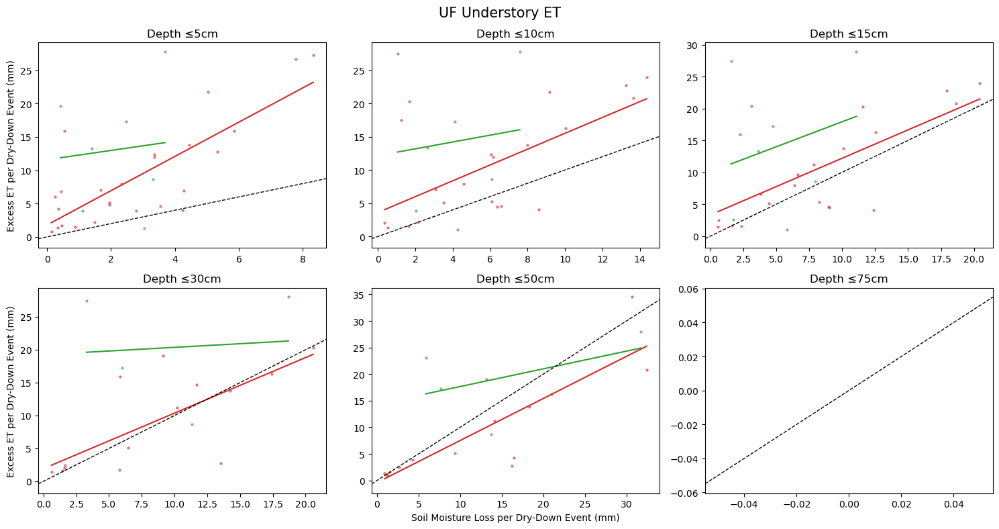

In [58]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and Site == 'UF' and z <= 50")
    .copy()
    .dropna()
)

year_group = []
for month in df.t_start.dt.month:
    if month in [4, 5, 6]:
        year_group.append("Spring")
    elif month in [7, 8, 9]:
        year_group.append("Summer")
    # elif month in [9]:
    #     year_group.append("Autumn")
df["year_group"] = year_group
m = ols("et ~ delta_s*C(z)*C(year_group)", data=df).fit()
# display(m.summary())
df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"Winter":"C0", "Spring":"C2", "Summer":"C3", "Autumn":"C1"}
colors = {"Spring":"C2", "Summer":"C3"}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
    axs[0].set_ylabel("Excess ET per Dry-Down Event (mm)")
    axs[3].set_ylabel("Excess ET per Dry-Down Event (mm)")
    fig.suptitle("UF Understory ET", size=15)
    for year in colors:
        plot_df = df.query("z == @z and year_group == @year").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site, color=colors[year])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], color=colors[year])
        # axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[year])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

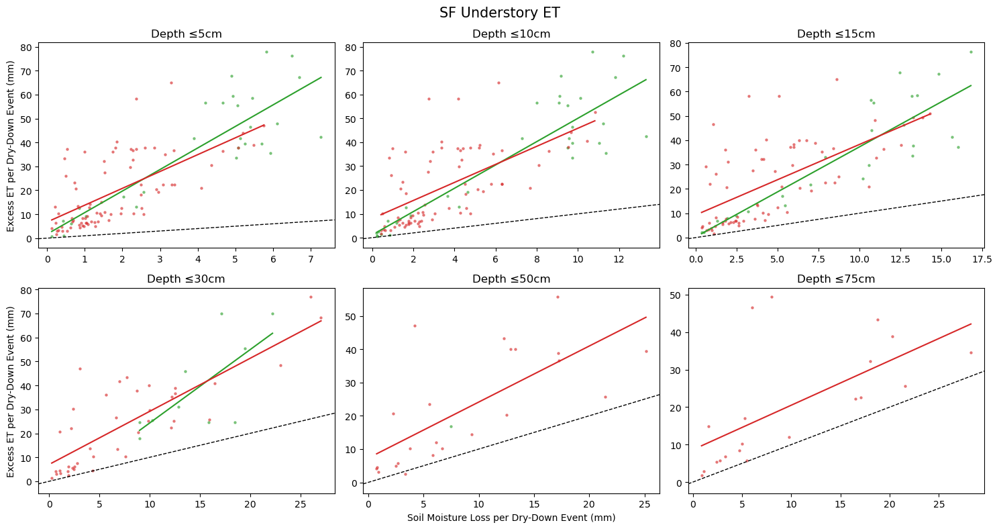

In [67]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and Site == 'SF' and z <= 75")
    .copy()
    .dropna()
)

year_group = []
for month in df.t_start.dt.month:
    if month in [4, 5, 6]:
        year_group.append("Spring")
    elif month in [7, 8, 9]:
        year_group.append("Summer")
    # elif month in [9]:
    #     year_group.append("Autumn")
df["year_group"] = year_group
m = ols("et ~ delta_s*C(z)*C(year_group)", data=df).fit()
# display(m.summary())
df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T

depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"Winter":"C0", "Spring":"C2", "Summer":"C3", "Autumn":"C1"}
colors = {"Spring":"C2", "Summer":"C3"}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
    axs[0].set_ylabel("Excess ET per Dry-Down Event (mm)")
    axs[3].set_ylabel("Excess ET per Dry-Down Event (mm)")
    fig.suptitle("SF Understory ET", size=15)
    for year in colors:
        plot_df = df.query("z == @z and year_group == @year").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site, color=colors[year])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], color=colors[year])
        # axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[year])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     et   R-squared:                       0.621
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     28.42
Date:                Mon, 02 Dec 2024   Prob (F-statistic):           9.12e-67
Time:                        15:11:27   Log-Likelihood:                -1565.3
No. Observations:                 404   AIC:                             3177.
Df Residuals:                     381   BIC:                             3269.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
===================================================================================================================
                                                      coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------
Intercept                                           4.1594      6.639      0.626      0.531      -8.895      17.214
C(z)[T.10.0]                                       -0.9122      9.530     -0.096      0.924     -19.649      17.825
C(z)[T.15.0]                                       -0.4773      9.656     -0.049      0.961     -19.464      18.509
C(z)[T.30.0]                                       -0.8272     13.699     -0.060      0.952     -27.762      26.107
C(z)[T.50.0]                                        0.3207      2.407      0.133      0.894      -4.413       5.054
C(z)[T.75.0]                                        0.9683     24.580      0.039      0.969     -47.361      49.298
C(year_group)[T.2020-2024]                          3.1114      6.967      0.447      0.655     -10.588      16.811
C(z)[T.10.0]:C(year_group)[T.2020-2024]             1.7332      9.985      0.174      0.862     -17.899      21.366
C(z)[T.15.0]:C(year_group)[T.2020-2024]             2.8563     10.127      0.282      0.778     -17.056      22.768
C(z)[T.30.0]:C(year_group)[T.2020-2024]             0.9245     14.160      0.065      0.948     -26.917      28.766
C(z)[T.50.0]:C(year_group)[T.2020-2024]             0.1531      2.453      0.062      0.950      -4.671       4.977
C(z)[T.75.0]:C(year_group)[T.2020-2024]             2.0959     25.090      0.084      0.933     -47.237      51.429
delta_s                                             3.1537      5.311      0.594      0.553      -7.290      13.597
delta_s:C(z)[T.10.0]                               -1.1086      6.252     -0.177      0.859     -13.401      11.184
delta_s:C(z)[T.15.0]                               -1.8750      5.911     -0.317      0.751     -13.497       9.746
delta_s:C(z)[T.30.0]                               -2.1765      5.889     -0.370      0.712     -13.755       9.402
delta_s:C(z)[T.50.0]                               -2.5195      4.662     -0.540      0.589     -11.687       6.648
delta_s:C(z)[T.75.0]                               -3.0529      7.714     -0.396      0.692     -18.220      12.114
delta_s:C(year_group)[T.2020-2024]                  4.5267      5.351      0.846      0.398      -5.995      15.048
delta_s:C(z)[T.10.0]:C(year_group)[T.2020-2024]    -2.4784      6.295     -0.394      0.694     -14.856       9.899
delta_s:C(z)[T.15.0]:C(year_group)[T.2020-2024]    -2.8686      5.953     -0.482      0.630     -14.574       8.837
delta_s:C(z)[T.30.0]:C(year_group)[T.2020-2024]    -3.2887      5.930     -0.555      0.579     -14.948       8.371
delta_s:C(z)[T.50.0]:C(year_group)[T.2020-2024]    -3.4989      4.680     -0.748      0.455     -12.700       5.702
delta_s:C(z)[T.75.0]:C(year_group)[T.2020-2024]    -3.5198      7.7

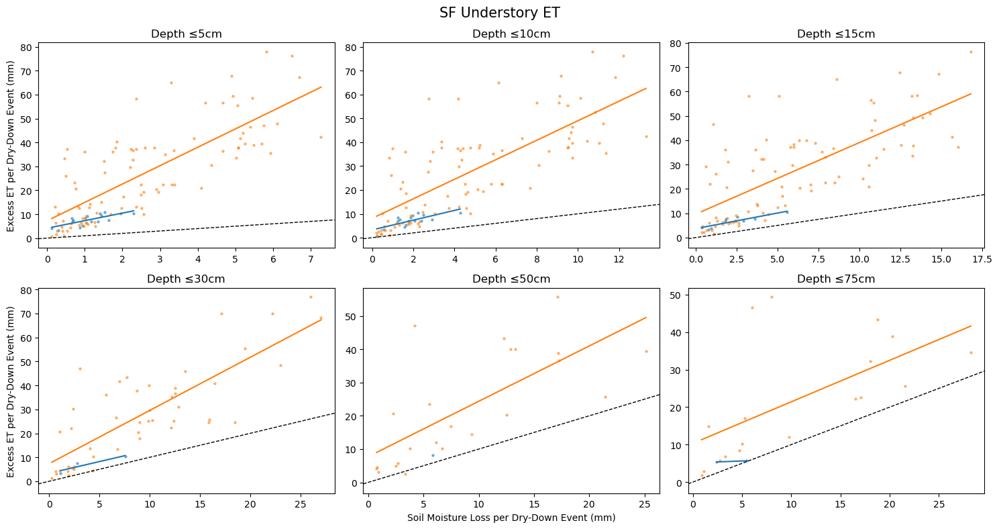

In [81]:
df = (
    drydown_fluxes.loc[drydown_fluxes.t_start.dt.month.isin([4, 5, 6, 7, 8, 9])]
    .query("Height == 'Understory' and Site == 'SF' and z <= 75")
    .copy()
    .dropna()
)

year_group = []
for year in df.t_start.dt.year:
    if year in [2019]:
        year_group.append(str(year))
    # elif year in [2020]:
    #     year_group.append(str(year))
    elif year > 2019:
        year_group.append("2020-2024")

df["year_group"] = year_group
m = ols("et ~ delta_s*C(z)*C(year_group)", data=df).fit()
display(m.summary())
df["et_pred"] = m.predict()
# envelope = wls_prediction
df[["et_stderr", "et_lci", "et_uci"]] =  np.asarray(wls_prediction_std(m)).T
depths = [5, 10, 15, 30, 50, 75]
fig, axs = plt.subplots(2, 3, figsize=(15, 8))
axs = axs.flatten()

colors = {"Winter":"C0", "Spring":"C2", "Summer":"C3", "Autumn":"C1"}
colors = {"Spring":"C2", "Summer":"C3"}
colors={"2019":"C0", "2020-2024":"C1", "2021-2024":"C2"}
# colors = {y:c for y, c in zip(range(2019, 2025), ["C0", "C1", "C2", "C3", "C4", "C5"])}
for i, z in enumerate(depths):
    axs[i].set_title(f"Depth ≤{z}cm")
    axs[4].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
    axs[0].set_ylabel("Excess ET per Dry-Down Event (mm)")
    axs[3].set_ylabel("Excess ET per Dry-Down Event (mm)")
    fig.suptitle("SF Understory ET", size=15)
    for year in colors:
        plot_df = df.query("z == @z and year_group == @year").sort_values("et_pred")
        axs[i].scatter(plot_df["delta_s"], plot_df["et"], s=5, alpha=0.5, label=site, color=colors[year])
        axs[i].plot(plot_df["delta_s"], plot_df["et_pred"], color=colors[year])
        # axs[i].fill_between(plot_df["delta_s"], plot_df["et_lci"], plot_df["et_uci"], alpha=0.3, color=colors[year])
    xlim = axs[i].get_xlim()
    # axs[i].hlines(0, *xlim, 'k', '--', lw=1)
    axs[i].plot(xlim, xlim, 'k--', lw=1)
    axs[i].set_xlim(xlim)

plt.tight_layout(w_pad=1.1)

/tmp/ipykernel_2934433/3225882262.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.2, w_pad=1.2)


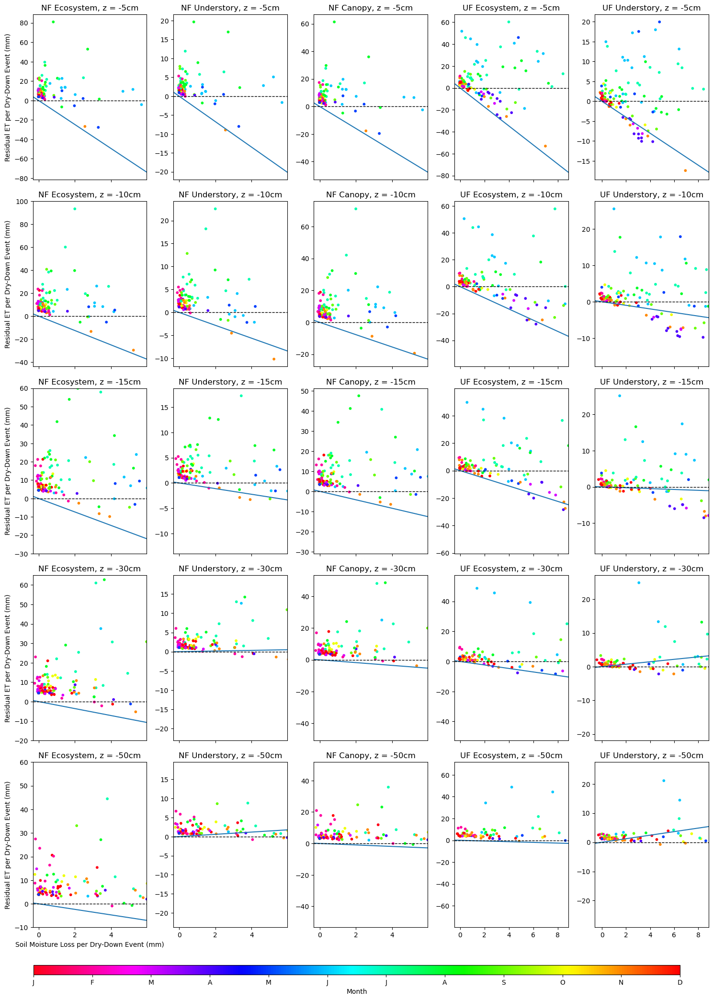

In [22]:
depths = [5, 10, 15, 30, 50]
site_dfs = [
    drydown_fluxes_nf,
    drydown_fluxes_nf_under,
    drydown_fluxes_nf_can,
    drydown_fluxes_uf,
    drydown_fluxes_uf_under,
]
sites = ["NF Ecosystem", "NF Understory", "NF Canopy", "UF Ecosystem", "UF Understory"]

def normalize_seasonal(months):
    return np.where(months <= 6, months/6, 1 - (months - 6)/6)

fig, axs = plt.subplots(5, 5, figsize=(15, 20), sharex="col")
axs = np.atleast_2d(axs)
for iz, z in enumerate(depths):
    for idf, df in enumerate(site_dfs):
        ax = axs[iz, idf]
        reg = stats.linregress(-df.query("z==@z").dropna()["delta_s"], df.query("z==@z").dropna()["et"])
        slope, intcpt = reg.slope, reg.intercept
        
        plot = ax.scatter(
            -1000*df.query("z==@z")["delta_s"], 
            1000*(df.query("z==@z")["et"]+df.query("z==@z")["delta_s"]*slope + intcpt),
            c=(df.query("z==@z").t_start.dt.month - 1)/12,
            cmap="hsv_r",
            s=10
        )
        xlim = ax.get_xlim()
        ax.plot(np.linspace(*xlim, 11), np.linspace(*xlim, 11) - (np.linspace(*xlim, 11)*slope + intcpt))
        ax.hlines(0, *xlim, 'k', '--', lw=1)
        ax.set_xlim(*xlim)
        # cbar = ax.colorbar(label="Month")
        # cbar_yticks = cbar.ax.get_yticks()
        # months = "JFMAMJJASOND"
        # cbar.ax.set_yticks(np.arange(0, 1, 1/12), months)
        ax.set_title(f"{sites[idf]}, z = -{z}cm")

axs[-1, 0].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
for ax in axs[:, 0]:
    ax.set_ylabel("Residual ET per Dry-Down Event (mm)")

fig.subplots_adjust(bottom=0.8)
cbar_ax = fig.add_axes([0.05, -0.02, 0.9, 0.01])
cbar = fig.colorbar(plot, cax=cbar_ax, orientation="horizontal")
cbar_ax.set_xlabel("Month")
cbar_xticks = cbar_ax.get_yticks()
months = "JFMAMJJASOND"
cbar_ax.set_xticks(np.arange(0, 1, 1/12), months)

# custom axis limits...ughhhh
axs[2, 0].set_ylim(-0.03*1000, 0.06*1000)
axs[3, 0].set_ylim(-0.02*1000, 0.065*1000)
axs[4, 0].set_ylim(-0.01*1000, 0.06*1000)

plt.tight_layout(h_pad=1.2, w_pad=1.2)

/tmp/ipykernel_2934433/2767186978.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.2, w_pad=1.2)


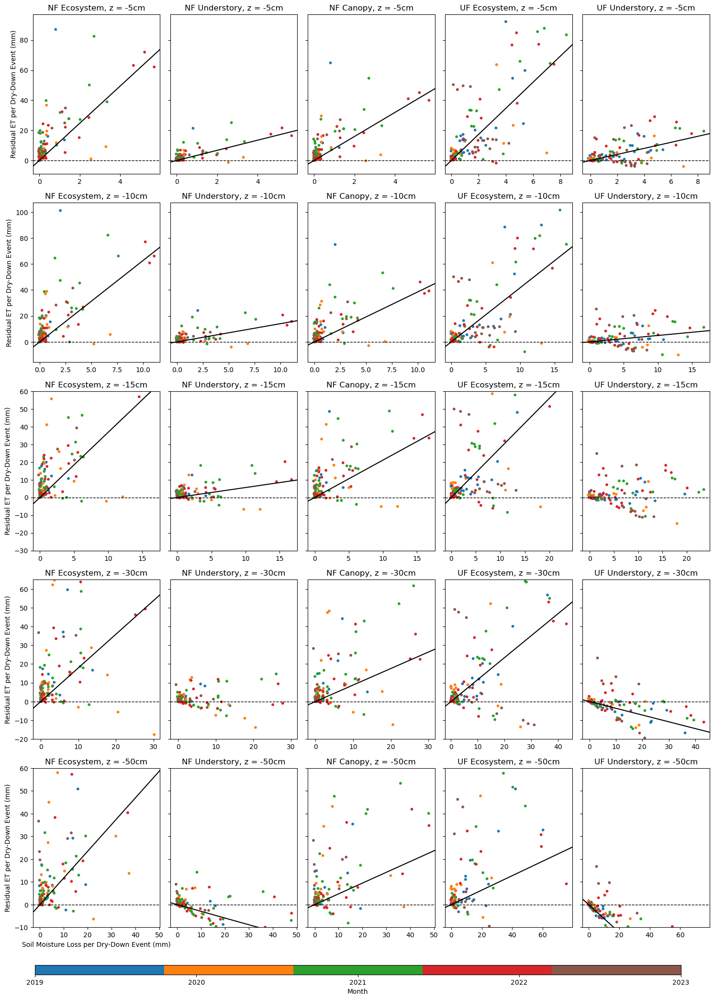

In [23]:
depths = [5, 10, 15, 30, 50]
site_dfs = [
    drydown_fluxes_nf,
    drydown_fluxes_nf_under,
    drydown_fluxes_nf_can,
    drydown_fluxes_uf,
    drydown_fluxes_uf_under,
]
sites = ["NF Ecosystem", "NF Understory", "NF Canopy", "UF Ecosystem", "UF Understory"]

def normalize_annual(years):
    return (years - 2019)/(2024-2019)

colors = ['C0', "C1", "C2", "C3", "C5"]
cmap = mpl.colors.ListedColormap(colors)

fig, axs = plt.subplots(5, 5, figsize=(15, 20), sharey="row")
axs = np.atleast_2d(axs)
for iz, z in enumerate(depths):
    for idf, df in enumerate(site_dfs):
        ax = axs[iz, idf]
        reg = stats.linregress(-df.query("z==@z").dropna()["delta_s"], df.query("z==@z").dropna()["et"] + df.query("z==@z").dropna()["delta_s"])
        slope, intcpt = reg.slope, reg.intercept
        
        plot = ax.scatter(
            -1000*df.query("z==@z")["delta_s"], 
            1000*(df.query("z==@z")["et"] + df.query("z==@z")["delta_s"]),
            c=(df.query("z==@z").t_start.dt.year - 2019)/(2023-2019),
            cmap=cmap,
            s=10
        )
        xlim = ax.get_xlim()
        if reg.pvalue < 0.05:
            ax.plot(np.linspace(*xlim, 11), (np.linspace(*xlim, 11)*slope + intcpt), color='k')
        ax.hlines(0, *xlim, 'k', '--', lw=1)
        ax.set_xlim(*xlim)
        # cbar = ax.colorbar(label="Month")
        # cbar_yticks = cbar.ax.get_yticks()
        # months = "JFMAMJJASOND"
        # cbar.ax.set_yticks(np.arange(0, 1, 1/12), months)
        ax.set_title(f"{sites[idf]}, z = -{z}cm")

axs[-1, 0].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
for ax in axs[:, 0]:
    ax.set_ylabel("Residual ET per Dry-Down Event (mm)")

fig.subplots_adjust(bottom=0.8)
cbar_ax = fig.add_axes([0.05, -0.02, 0.9, 0.01])
cbar = fig.colorbar(plot, cax=cbar_ax, orientation="horizontal")
cbar_ax.set_xlabel("Month")
cbar_xticks = cbar_ax.get_yticks()
months = "JFMAMJJASOND"
cbar_ax.set_xticks(np.linspace(0, 1, 5), np.arange(2019, 2024, 1))

# custom axis limits...ughhhh
axs[2, 0].set_ylim(-0.03*1000, 0.06*1000)
axs[3, 0].set_ylim(-0.02*1000, 0.065*1000)
axs[4, 0].set_ylim(-0.01*1000, 0.06*1000)

plt.tight_layout(h_pad=1.2, w_pad=1.2)

Re-plot with colored regressionlines

Observations:
* wintertime fluxes and soil moisture changes are generally very low
* Summertime (Jul - Oct) likely do not draw from shallow soil moisture in NF as much as they do in UF
* Early spring (Mar-Apr) fluxes are associated with shallow soil moisture for both whole ecosystem and understory fluxes in the UF treatment. This association is stronger than in the NF treatment
* Late spring (May-Jun) is much more variable in its association with soil moisture dynamics, but seems to prefer deep soil moisture in both cases.
* Immediately following the fire, shallow soil moisture (<=15cm) changes were tightly linked to evapotranspiration in the UF treatment understory tower. This link is *not* seen in the NF treatment.
* Several years after the fire, there is more variance in the residuals in UF understory fluxes, especially in deeper layers.

/tmp/ipykernel_2934433/2936581162.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=1.2, w_pad=1.2)


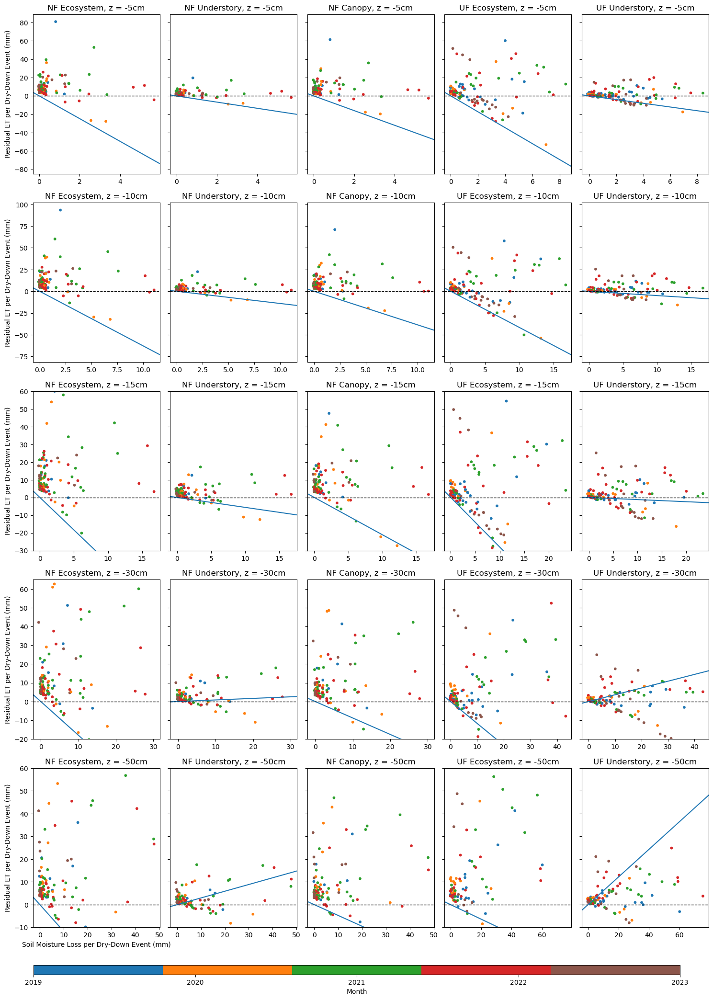

In [24]:
depths = [5, 10, 15, 30, 50]
site_dfs = [
    drydown_fluxes_nf,
    drydown_fluxes_nf_under,
    drydown_fluxes_nf_can,
    drydown_fluxes_uf,
    drydown_fluxes_uf_under,
]
sites = ["NF Ecosystem", "NF Understory", "NF Canopy", "UF Ecosystem", "UF Understory"]

def normalize_annual(years):
    return (years - 2019)/(2024-2019)

colors = ['C0', "C1", "C2", "C3", "C5"]
cmap = mpl.colors.ListedColormap(colors)

fig, axs = plt.subplots(5, 5, figsize=(15, 20), sharey="row")
axs = np.atleast_2d(axs)
for iz, z in enumerate(depths):
    for idf, df in enumerate(site_dfs):
        ax = axs[iz, idf]
        reg = stats.linregress(-df.query("z==@z").dropna()["delta_s"], df.query("z==@z").dropna()["et"])
        slope, intcpt = reg.slope, reg.intercept
        
        plot = ax.scatter(
            -1000*df.query("z==@z")["delta_s"], 
            1000*(df.query("z==@z")["et"]+df.query("z==@z")["delta_s"]*slope + intcpt),
            c=(df.query("z==@z").t_start.dt.year - 2019)/(2023-2019),
            cmap=cmap,
            s=10
        )
        xlim = ax.get_xlim()
        ax.plot(np.linspace(*xlim, 11), np.linspace(*xlim, 11) - (np.linspace(*xlim, 11)*slope + intcpt))
        ax.hlines(0, *xlim, 'k', '--', lw=1)
        ax.set_xlim(*xlim)
        # cbar = ax.colorbar(label="Month")
        # cbar_yticks = cbar.ax.get_yticks()
        # months = "JFMAMJJASOND"
        # cbar.ax.set_yticks(np.arange(0, 1, 1/12), months)
        ax.set_title(f"{sites[idf]}, z = -{z}cm")

axs[-1, 0].set_xlabel("Soil Moisture Loss per Dry-Down Event (mm)")
for ax in axs[:, 0]:
    ax.set_ylabel("Residual ET per Dry-Down Event (mm)")

fig.subplots_adjust(bottom=0.8)
cbar_ax = fig.add_axes([0.05, -0.02, 0.9, 0.01])
cbar = fig.colorbar(plot, cax=cbar_ax, orientation="horizontal")
cbar_ax.set_xlabel("Month")
cbar_xticks = cbar_ax.get_yticks()
months = "JFMAMJJASOND"
cbar_ax.set_xticks(np.linspace(0, 1, 5), np.arange(2019, 2024, 1))

# custom axis limits...ughhhh
axs[2, 0].set_ylim(-0.03*1000, 0.06*1000)
axs[3, 0].set_ylim(-0.02*1000, 0.065*1000)
axs[4, 0].set_ylim(-0.01*1000, 0.06*1000)

plt.tight_layout(h_pad=1.2, w_pad=1.2)

# Bulk of Analysis

Compute mean slope
compute standard error
for n in range(100)
    randomly sample slopes
    find the optimal depth
find mean optimal depth
find stderr of optimal depth

## Pure Uptake Depth

In [3]:
drydown_fluxes = pd.read_pickle("drydown_fluxes.pickle")

Text(0.5, 1.0, 'All ET')

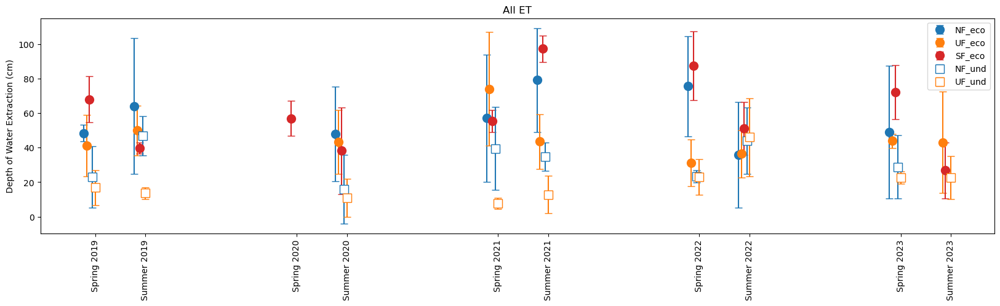

In [4]:
# drydown_fluxes["xax"], xlabel = drydown_fluxes.t_start.dt.year + np.where(drydown_fluxes.t_start.dt.month.isin([4, 5, 6]), 0, 1)/2, "Year + Season (0 Spring, 0.5 Summer)"
_, _, drydown_fluxes["xax"] = get_WY_and_season(drydown_fluxes.t_start)

best_depths, best_depth_stderrs, best_depths_rounded = compute_uptake_depth(drydown_fluxes)
best_depths = best_depths.loc[~best_depths.index.str.contains("Winter")]
best_depth_stderrs = best_depth_stderrs.loc[~best_depth_stderrs.index.str.contains("Winter")]
best_depths_rounded = best_depths_rounded.loc[~best_depths_rounded.index.str.contains("Winter")]

warnings.resetwarnings()
fig = plt.figure(figsize=(20,10))

fig.add_subplot(211)
for i, c in enumerate(best_depths.drop(columns=["TIMESTAMP"])):
    marker = "o"
    linestyle = "-"
    if "NF" in c: color = "C0"
    elif "SF" in c: color = "C3"
    elif "UF" in c: color = "C1"
    
    if "und" in c: marker, facecolor = "s", "white"
    else: facecolor = color

    xax = (best_depths.TIMESTAMP.dt.year + best_depths.TIMESTAMP.dt.month/12 - 1/36 + i/72).values
    plt.errorbar(
        x=xax,#best_depths.index - 1/12 + i/24, 
        y=best_depths[c], 
        yerr=best_depth_stderrs[c], 
        marker=marker, 
        markerfacecolor=facecolor, 
        linestyle="none", 
        color=color, 
        markersize=10, 
        capsize=4,
        label=c
    )
plt.xticks(xax, best_depths.index, rotation=90)

plt.ylabel("Depth of Water Extraction (cm)")
plt.legend();
plt.title("All ET")

What we want to do:
* combine everything we could possibly care about into 1 (DAILY) dataframe

ET:
* daytime only daily
* annual cumulative daytime
* annual cumulative whole day

Carbon:
* daytime only daily
* annual cumulative daytime

precip:
* daily
* annual cumulative

soil moisture stuff:
* daily

PET inputs:
* daytime only
* whole day
* annual cumulative for both daytime only and whole day



In [24]:
# turbulent fluxes
daylight_hours = np.arange(10, 15)
flux_data_daylight = (
    flux_nf.loc[flux_nf.index.hour.isin(daylight_hours)]
    .merge(flux_nf_under.loc[flux_nf_under.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer", suffixes=["-NF_eco", "-NF_und"])
    .merge(flux_sf.loc[flux_sf.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer")
    .merge(flux_uf_under.loc[flux_uf_under.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer", suffixes=["-SF_eco", "-UF_und"])
    .merge(flux_uf.loc[flux_uf.index.hour.isin(daylight_hours)], left_index=True, right_index=True, how="outer")
    .rename(columns=dict(ET="ET-UF_eco", NEE="NEE-UF_eco", GPP="GPP-UF_eco", Reco="Reco-UF_eco", TA="TA-UF_eco", VPD="VPD-UF_eco", PotRad="PotRad-UF_eco", Rg="Rg-UF_eco", Rnet="Rnet-UF_eco", WS="WS-UF_eco"))
)
flux_data_daylight[["WUE-NF_eco", "WUE-NF_und", "WUE-SF_eco", "WUE-UF_und", "WUE-UF_eco"]] = flux_data_daylight.filter(regex="^GPP").values / (flux_data_daylight.filter(regex="^ET").values) * 0.997  # gC/kgH2O
for c in ["NF_eco", "NF_und", "SF_eco", "UF_und", "UF_eco"]:
    flux_data_daylight[f"WUE-{c}"] = flux_data_daylight[f"WUE-{c}"].where((flux_data_daylight[f"ET-{c}"] > 0.5/1000))# & (WUE_data[f"GPP-{c}"] >= 0))

flux_data_allday = (
    flux_nf
    .merge(flux_nf_under, left_index=True, right_index=True, how="outer", suffixes=["-NF_eco", "-NF_und"])
    .merge(flux_sf, left_index=True, right_index=True, how="outer")
    .merge(flux_uf_under, left_index=True, right_index=True, how="outer", suffixes=["-SF_eco", "-UF_und"])
    .merge(flux_uf, left_index=True, right_index=True, how="outer")
    .rename(columns=dict(ET="ET-UF_eco", NEE="NEE-UF_eco", GPP="GPP-UF_eco", Reco="Reco-UF_eco", TA="TA-UF_eco", VPD="VPD-UF_eco", PotRad="PotRad-UF_eco", Rg="Rg-UF_eco", Rnet="Rnet-UF_eco", WS="WS-UF_eco"))
)
flux_data_allday[["WUE-NF_eco", "WUE-NF_und", "WUE-SF_eco", "WUE-UF_und", "WUE-UF_eco"]] = flux_data_allday.filter(regex="^GPP").values / (flux_data_allday.filter(regex="^ET").values) * 0.997  # gC/kgH2O
for c in ["NF_eco", "NF_und", "SF_eco", "UF_und", "UF_eco"]:
    flux_data_allday[f"WUE-{c}"] = flux_data_allday[f"WUE-{c}"].where((flux_data_allday[f"ET-{c}"] > 0.5/1000))# & (WUE_data[f"GPP-{c}"] >= 0))

flux_data = (
    (flux_data_allday.groupby(pd.Grouper(freq="1d")).sum(min_count=48)/48)
    .merge(
        (flux_data_daylight.groupby(pd.Grouper(freq="1d")).sum(min_count=10)/10), 
        left_index=True, right_index=True, how="inner", suffixes=(",allday", ",daytime")
    )
)

# compute the "effective soil moisture"
sf_depths = fill_best_depths(best_depths_rounded, sf_data, "SF_eco")
nf_depths = fill_best_depths(best_depths_rounded, nf_data, "NF_eco")
nf_under_depths = fill_best_depths(best_depths_rounded, nf_under_data, "NF_und")
uf_under_depths = fill_best_depths(best_depths_rounded, uf_under_data, "UF_und")

sf_useful_s = compute_usable_s(sf_data, sf_depths, "ABCD")#.rename(columns={c:f"{c}-SF_eco" for c in sf_useful_s})
nf_useful_s = compute_usable_s(nf_data, nf_depths, "AC")#.rename(columns={c:f"{c}-NF_eco" for c in nf_useful_s})
nf_under_useful_s = compute_usable_s(nf_under_data, nf_under_depths, "AC")#.rename(columns={c:f"{c}-NF_und" for c in nf_under_useful_s})
uf_under_useful_s = compute_usable_s(uf_under_data, uf_under_depths, "ABC")#.rename(columns={c:f"{c}-UF_und" for c in uf_under_useful_s})

useful_s = (
    sf_useful_s[["Seff", "VWCeff"]]
    .merge(nf_useful_s[["Seff", "VWCeff"]], left_index=True, right_index=True, suffixes=("-SF_eco", "-NF_eco"), how="outer")
    .merge(nf_under_useful_s[["Seff", "VWCeff"]], left_index=True, right_index=True, how="outer")
    .merge(uf_under_useful_s[["Seff", "VWCeff"]], left_index=True, right_index=True, suffixes=("-NF_und", "-UF_und"), how="outer")
)
useful_s = useful_s.groupby(pd.Grouper(freq="1d")).mean()

# get VWC at each depth
vwc_sf_2 = vwc_sf.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_sf_2[f"VWC.{z}"] = vwc_sf_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_sf_2 = vwc_sf_2.filter(regex="VWC\\.[0-9]+")
vwc_sf_2

vwc_nf_2 = vwc_nf.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_nf_2[f"VWC.{z}"] = vwc_nf_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_nf_2 = vwc_nf_2.filter(regex="VWC\\.[0-9]+")
vwc_sf_2

vwc_nf_under_2 = vwc_nf_under.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_nf_under_2[f"VWC.{z}"] = vwc_nf_under_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_nf_under_2 = vwc_nf_under_2.filter(regex="VWC\\.[0-9]+")

vwc_uf_under_2 = vwc_uf_under.copy()
for z in [5, 10, 15, 30, 50, 75, 100]:
    vwc_uf_under_2[f"VWC.{z}"] = vwc_uf_under_2.filter(regex=f"VWC_[ABC]-{z}").mean(1)
vwc_uf_under_2 = vwc_uf_under_2.filter(regex="VWC\\.[0-9]+")

vwc = (
    vwc_sf_2
    .merge(vwc_nf_2, left_index=True, right_index=True, suffixes=("-SF_eco", "-NF_eco"), how="outer")
    .merge(vwc_nf_under_2, left_index=True, right_index=True, how="outer")
    .merge(vwc_uf_under_2, left_index=True, right_index=True, suffixes=("-NF_und", "-UF_und"), how="outer")
)
vwc = vwc.groupby(pd.Grouper(freq="1d")).mean()

# daymet precip
precip = pd.read_csv("../snotel_P.csv", parse_dates=["TIMESTAMP"])
precip["P"] = precip["P"]/1000  # keep in units of m/day
precip = precip.set_index("TIMESTAMP")

flux_data = (
    flux_data
    .merge(useful_s, left_index=True, right_index=True, how="outer")
    .merge(vwc, left_index=True, right_index=True, how="outer")
    .merge(precip, left_index=True, right_index=True, how="outer")
)

# compute PET
flux_data["zm-NF_eco"] = 18
flux_data["zm-NF_und"] = 3
flux_data["zm-SF_eco"] = 4
flux_data["zm-UF_eco"] = 18
flux_data["zm-UF_und"] = 3

flux_data["zc-NF_eco"] = 16
flux_data["zc-NF_und"] = 0.1
flux_data["zc-SF_eco"] = 0.5
flux_data["zc-UF_eco"] = 16
flux_data["zc-UF_und"] = 0.1

for site in ["NF_und", "NF_eco", "UF_und", "UF_eco", "SF_eco"]:
    flux_data[f"PET-{site},allday"] = penman_monteith(
        T_c=flux_data[f"TA-{site},allday"],
        Rn_W=flux_data[f"Rnet-{site},allday"],
        G_W=0,
        vpd_kPa=flux_data[f"VPD-{site},allday"]*0.1,
        LAI=5,
        u=flux_data[f"WS-{site},allday"],
        zm=flux_data[f"zm-{site}"],
        zc=flux_data[f"zc-{site}"],
        Pa_kPa=77
    )*86400/1000  # m/d
    flux_data[f"PET-{site},daytime"] = penman_monteith(
        T_c=flux_data[f"TA-{site},daytime"],
        Rn_W=flux_data[f"Rnet-{site},daytime"],
        G_W=0,
        vpd_kPa=flux_data[f"VPD-{site},daytime"]*0.1,
        LAI=5,
        u=flux_data[f"WS-{site},daytime"],
        zm=flux_data[f"zm-{site}"],
        zc=flux_data[f"zc-{site}"],
        Pa_kPa=77
    )*86400/1000  # m/d

# annual cumulative values
# we want to compute a cumulative sum, but we need to first make sure that we have a gapless dataset.
# at this points, gaps in the data are minimal, and we can just fill any gaps with monthly mean values.
flux_data["WY"], flux_data["Season"], flux_data["WY_Season"] = get_WY_and_season(flux_data.index)

monthly_means = (
    flux_data[[]]
    .merge(
        flux_data
            .filter(regex="^ET|^GPP|^NEE|^P$|^PET")
            .groupby(flux_data.index.month)
            .mean()
            .reset_index(),
        left_on=flux_data.index.month, right_on="TIMESTAMP",
        how="left"
    ).set_index(flux_data.index)
    .drop(columns="TIMESTAMP")
)
filled_for_cumsum = flux_data.filter(regex="^ET|^GPP|^NEE|^P$|^PET").fillna(monthly_means)
filled_for_cumsum["WY"], _, _ = get_WY_and_season(filled_for_cumsum.index)

flux_data = flux_data.merge(
    filled_for_cumsum.groupby("WY").cumsum(),
    left_index=True, right_index=True, how="inner", suffixes=(".daily", ".anncum")
)

# scale the "daylight" values appropriately
for c in flux_data.filter(regex="daytime"):
    flux_data[c] = flux_data[c]*len(daylight_hours)/48

flux_data.head()

,"ET-NF_eco,allday.daily","Reco-NF_eco,allday","GPP-NF_eco,allday.daily","NEE-NF_eco,allday.daily","VPD-NF_eco,allday","TA-NF_eco,allday","Rg-NF_eco,allday","Rnet-NF_eco,allday","PotRad-NF_eco,allday","WS-NF_eco,allday",...,"PET-NF_und,allday.anncum","PET-NF_und,daytime.anncum","PET-NF_eco,allday.anncum","PET-NF_eco,daytime.anncum","PET-UF_und,allday.anncum","PET-UF_und,daytime.anncum","PET-UF_eco,allday.anncum","PET-UF_eco,daytime.anncum","PET-SF_eco,allday.anncum","PET-SF_eco,daytime.anncum"
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2018-04-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000702,0.000236,0.003435,0.000527,0.000887,0.000295,NaN,0.000472,0.001754,0.000609
2018-04-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.001403,0.000472,0.006869,0.001054,0.001774,0.000590,NaN,0.000945,0.003508,0.001219
2018-04-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.002105,0.000709,0.010304,0.001581,0.002660,0.000885,NaN,0.001417,0.005263,0.001828
2018-04-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.002806,0.000945,0.013738,0.002109,0.003547,0.001180,NaN,0.001890,0.007017,0.002438
2018-04-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.003508,0.001181,0.017173,0.002636,0.004434,0.001475,NaN,0.002362,0.008771,0.003047


var-site_height,time.sum

In [74]:
set([c.split("-")[0] for c in df.filter(regex="-[A-Za-z_]+")])

{'ET',
 'GPP',
 'NEE',
 'PET',
 'PotRad',
 'Reco',
 'Rg',
 'Rnet',
 'Seff',
 'TA',
 'VPD',
 'VWC.10',
 'VWC.100',
 'VWC.15',
 'VWC.30',
 'VWC.5',
 'VWC.50',
 'VWC.75',
 'VWCeff',
 'WS',
 'WUE',
 'zc',
 'zm'}

In [77]:
df = pd.wide_to_long(
    flux_data.reset_index(), 
    stubnames=set([c.split(".")[0] for c in flux_data.filter(regex="daily|anncum$")]), 
    i="TIMESTAMP", 
    j="stat", 
    sep=".",suffix="\\D+"
)

df = pd.wide_to_long(
    df.reset_index(), 
    stubnames=set([c.split(",")[0] for c in df.filter(regex="allday|daytime")]), 
    i=["TIMESTAMP", "stat"], 
    j="time_of_day", 
    sep=",", suffix="\\D+"
)

df = pd.wide_to_long(
    df.reset_index(), 
    stubnames=set([c.split("-")[0] for c in df.filter(regex="-[A-Za-z_]+")]), 
    i=["TIMESTAMP", "stat", "time_of_day"], 
    j="site", 
    sep="-", suffix="\\D+"
)

flux_long = df.reset_index()

flux_long

,TIMESTAMP,stat,time_of_day,site,P,Season,WY,WY_Season,Rg,VWC.50,...,WS,zc,PotRad,PET,Rnet,TA,Reco,VPD,NEE,zm
0,2018-04-25,daily,allday,NF_und,0.000000,Spring,2018,Spring 2018,NaN,NaN,...,NaN,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1,2018-04-25,daily,allday,UF_und,0.000000,Spring,2018,Spring 2018,NaN,NaN,...,NaN,0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
2,2018-04-25,daily,allday,NF_eco,0.000000,Spring,2018,Spring 2018,NaN,NaN,...,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18
3,2018-04-25,daily,allday,UF_eco,0.000000,Spring,2018,Spring 2018,NaN,NaN,...,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18
4,2018-04-25,daily,allday,SF_eco,0.000000,Spring,2018,Spring 2018,NaN,NaN,...,NaN,0.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49875,2025-02-20,anncum,daytime,NF_und,0.446005,Winter,2025,Winter 2025,NaN,NaN,...,NaN,0.1,NaN,0.010422,NaN,NaN,NaN,NaN,0.006659,3
49876,2025-02-20,anncum,daytime,UF_und,0.446005,Winter,2025,Winter 2025,NaN,NaN,...,NaN,0.1,NaN,0.014104,NaN,NaN,NaN,NaN,0.004217,3
49877,2025-02-20,anncum,daytime,NF_eco,0.446005,Winter,2025,Winter 2025,NaN,NaN,...,NaN,16.0,NaN,0.044893,NaN,NaN,NaN,NaN,NaN,18
49878,2025-02-20,anncum,daytime,UF_eco,0.446005,Winter,2025,Winter 2025,NaN,NaN,...,NaN,16.0,NaN,0.052171,NaN,NaN,NaN,NaN,NaN,18


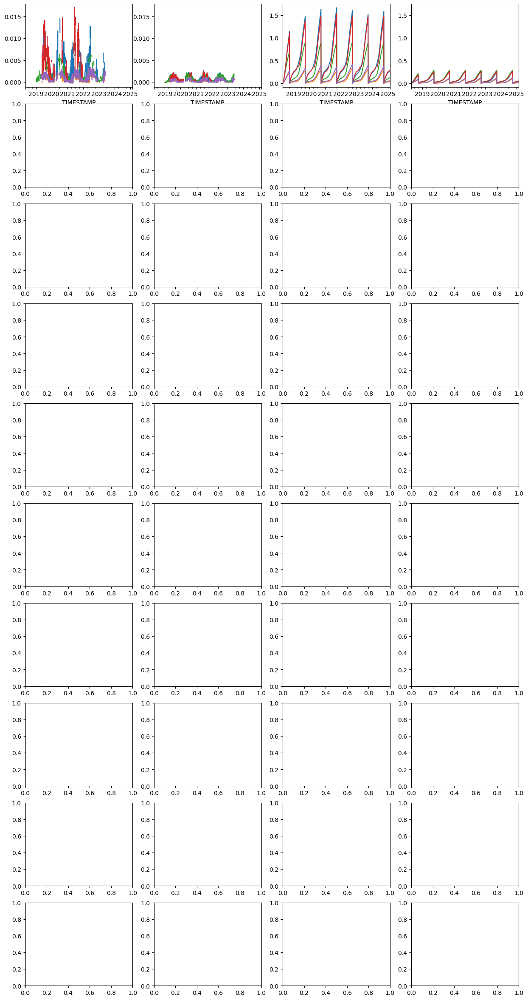

In [83]:
fig, axs = plt.subplots(10, 4, figsize=(15, 30))

for (stat, time, site), df in flux_long.groupby(["stat", "time_of_day", "site"]):
    match (stat, time):
        case "daily", "allday": col=0
        case "daily", "daytime": col=1
        case "anncum", "allday": col=2
        case "anncum", "daytime": col=3

    df.plot("TIMESTAMP", "PET", ax=axs[0, col], label=None, legend=False)
    axs[0, 1].set_ylim(axs[0, 0].get_ylim())
    axs[0, 3].set_ylim(axs[0, 2].get_ylim())
    

In [7]:
flux_data.to_csv("all_data.csv")

In [5]:
flux_data = pd.read_csv("all_data.csv", parse_dates=["TIMESTAMP"]).set_index("TIMESTAMP")

In [7]:
def ZDW_01(PET, P):
    w=1.06
    return (1 + w*PET/P)/(1 + w*(PET/P) + (PET/P)**-1)

triggered NF_eco ET-NF_eco,allday.anncum
triggered NF_eco ET-NF_eco,daytime.anncum


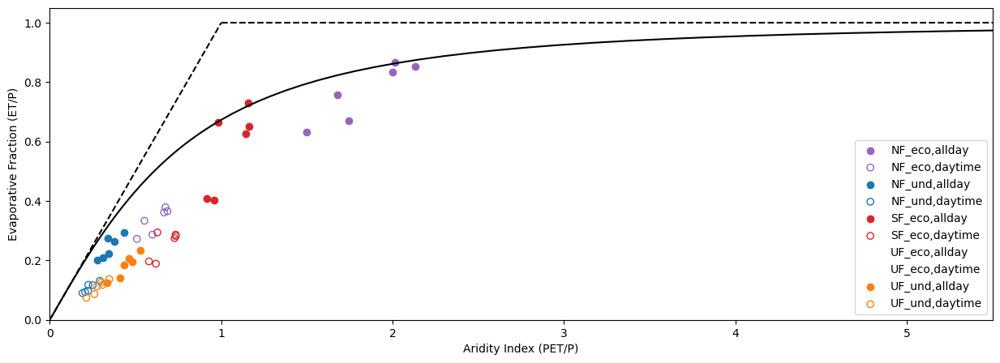

In [9]:
def ZDW_01(PET, P):
    w=1.06
    return (1 + w*PET/P)/(1 + w*(PET/P) + (PET/P)**-1)

# 92 gets us to 9/30
tminus = "92d"
annual_totals = flux_data.loc[pd.date_range("2019-01-02", "2025-01-02", freq="1YE") - pd.Timedelta(tminus)].filter(regex=".*anncum|^WY$")

arid_idx = annual_totals.filter(regex="^PET")/annual_totals[["P.anncum"]].values
evap_idx = annual_totals.filter(regex="^ET")/annual_totals[["P.anncum"]].values

plt.figure(figsize=(15,5))
for arid_c, evap_c in zip(sorted(arid_idx), sorted(evap_idx)):
    site = arid_c.split("-")[1].split(",")[0]
    match site:
        case "NF_und":
            color = "C0"
        case "NF_eco":
            color = "C4"
            print("triggered", site, evap_c, )
        case "UF_eco":
            color = "none"
        case "UF_und":
            color = "C1"
        case "SF_eco":
            color = "C3"
    time = arid_c.split(",")[1].split(".")[0]
    match time:
        case "daytime":
            fill = "none"
        case "allday":
            fill = color
    
    scale = 1
    if "daytime" in arid_c: scale = 10/48
    plt.scatter(arid_idx[arid_c]*scale, evap_idx[evap_c]*scale, label=arid_c.split("-")[1].split(".")[0], edgecolor=color, color=fill)
x = np.logspace(np.log10(0.01), np.log10(6), 101)
plt.plot(x, ZDW_01(x, 1), color='k')
plt.plot([0, 1], [0, 1], 'k--')
plt.plot([1, 8], [1, 1], 'k--')
plt.legend()
plt.ylim(0, 1.05)
plt.xlim(0, 5.5)
plt.xlabel("Aridity Index (PET/P)")
plt.ylabel("Evaporative Fraction (ET/P)");

Pros and cons of using NEE for computing WUE instead of GPP

Pros
* Reco (and therefore GPP) estimates are obtained from nighttime flux data (In the Reichstein 2005 model). However, atmospheric conditions may differ between daytime and nighttime, changing the carbon flux behavior. Additionally, soil and root respiration may behave differently at night than during the day, making Reco estimates derived from nighttime carbon flux biased.
* The Reichstein 2005 model assumes Reco depends solely on air temperature (within a several-day window), which is likely does not.

Cons
* WUE values near zero are unambiguous. When using GPP to compute WUE, WUE values near zero always indicate that ET is much higher than GPP. When using NEE instead, WUE values near zero can mean that ET is much higher than GPP, or they can mean that Reco and GPP are balanced. This scenario can often occur during periods of high ET, when soils are more moist, increasing overall Reco, further confounding matters.
* WUE values above zero are difficult to interpret. Especially in the understory, Reco can often outpace GPP, resulting in positive NEE values and therefore negative WUE values.

One concern when using GPP in this study is that GPP may be grossly overestimated in the BB-SF region: large swings in surface temperature and soil moisture could contribute to significant over-estimation of GPP by the Reichstein model. However, we do see that the reichstein model predicts large jumps in GPP during large pulses of ET, which inspires some more confidence.

In [55]:
flux_long = pd.wide_to_long(
    flux_data.reset_index(),
    stubnames=["ET", "NEE", "GPP", "WUE", "Reco", "TA", "VPD", "Seff", "VWCeff", "Rg", "Rnet", "PotRad", "WS"] + [f"VWC.{z}" for z in [5, 10, 15, 30, 50, 75, 100]],
    i="TIMESTAMP",
    j="Site",
    sep="-",
    suffix="(NF_eco|NF_und|SF_eco|UF_und|UF_eco)"
).reset_index()

flux_long["Season"] = np.where(flux_long['TIMESTAMP'].dt.month.isin([5, 6]), 0, 0.5)#np.where(WUE_long['TIMESTAMP'].dt.month.isin([8, 9]), "Summer", "Fall"))
flux_long["Month"] = flux_long["TIMESTAMP"].dt.month
flux_long["Year"] = flux_long["TIMESTAMP"].dt.year
flux_long["YS"] = flux_long["TIMESTAMP"].dt.year + np.where(flux_long['TIMESTAMP'].dt.month.isin([5, 6, 7]), 0, 0.5)
flux_long["YM"] = flux_long["TIMESTAMP"].dt.year + (flux_long["TIMESTAMP"].dt.month/12).round(2)

In [56]:
grouping_col = "YS"
best_depths_long = pd.wide_to_long(
    best_depths.rename(columns={c:f"UptakeDepth-{c}" for c in best_depths}).reset_index(),
    stubnames=["UptakeDepth"],
    i="index",
    j="Site",
    sep="-",
    suffix="(NF_eco|NF_und|SF_eco|UF_und|UF_eco)"
).reset_index()

best_depth_stderrs_long = pd.wide_to_long(
    best_depth_stderrs.rename(columns={c:f"UptakeDepthStdErr-{c}" for c in best_depths}).reset_index(),
    stubnames=["UptakeDepthStdErr"],
    i="index",
    j="Site",
    sep="-",
    suffix="(NF_eco|NF_und|SF_eco|UF_und|UF_eco)"
).reset_index()

merged = (
    best_depths_long
    .merge(
        best_depth_stderrs_long, 
        on=["index", "Site"],
        how="inner"
    )
    .merge(
        flux_long.groupby([grouping_col, "Site"]).mean().reset_index(), 
        left_on=["index", "Site"], right_on=[grouping_col, "Site"],
        how="inner"
    )
    .merge(
        (
            (flux_long[["NEE", grouping_col, "Site", "GPP", "ET", "WUE", "Seff", "VWCeff"] + [f"VWC.{z}" for z in [5, 10, 15, 30, 50, 75, 100]]].groupby([grouping_col, "Site"]).std()
             / np.sqrt(flux_long[["NEE", grouping_col, "Site", "GPP", "ET", "WUE", "Seff", "VWCeff"] + [f"VWC.{z}" for z in [5, 10, 15, 30, 50, 75, 100]]].groupby([grouping_col, "Site"]).count()))
            .reset_index()
        ),
        left_on=["index", "Site"], right_on=[grouping_col, "Site"],
        how="inner",
        suffixes=["", "_stderr"]
    )
)

TypeError: agg function failed [how->mean,dtype->object]

NF_eco
NF_und
SF_eco
UF_eco
UF_und


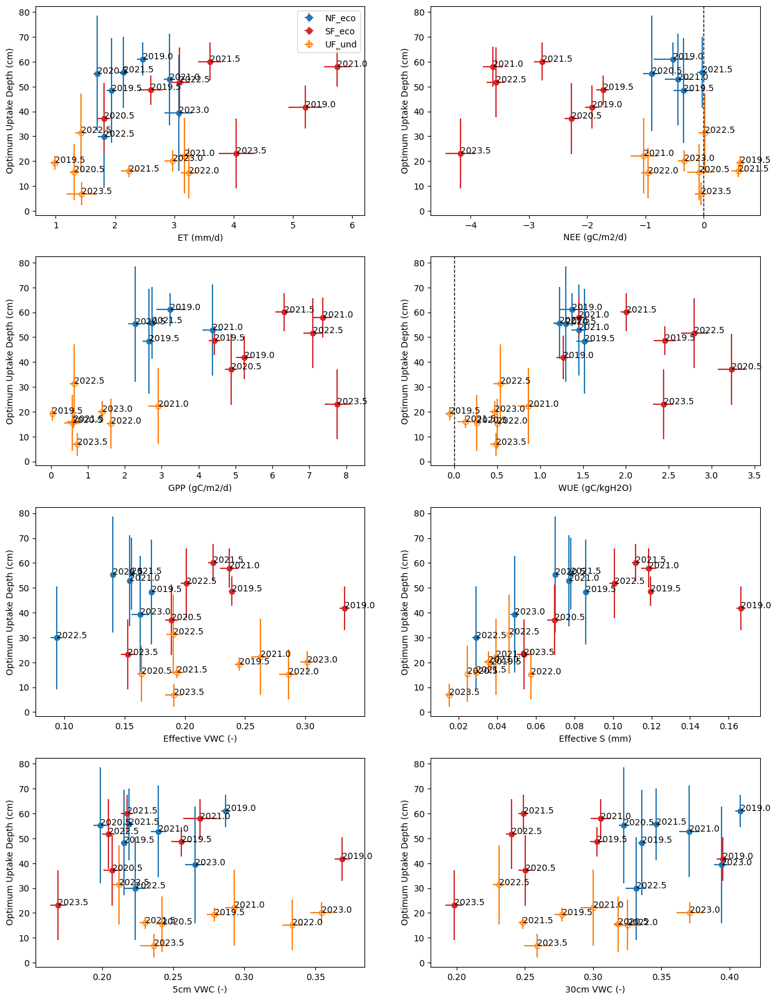

In [20]:
fig, axs = plt.subplots(4, 2, figsize=(15,20))
axs = axs.flatten()

axs[0].set_xlabel("ET (mm/d)")
axs[1].set_xlabel("NEE (gC/m2/d)")
axs[2].set_xlabel("GPP (gC/m2/d)")
axs[3].set_xlabel("WUE (gC/kgH2O)")
axs[4].set_xlabel("Effective VWC (-)")
axs[5].set_xlabel("Effective S (mm)")
axs[6].set_xlabel("5cm VWC (-)")
axs[7].set_xlabel("30cm VWC (-)")
for ax in axs:
    ax.set_ylabel("Optimum Uptake Depth (cm)")

warnings.simplefilter("ignore")
import warnings
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", message="posx and posy should be finite values")
def label_point(ax, df, grouping_col, xcol, ycol, xmult=1, ymult=1):
    for d in df[grouping_col]:
        x = df.loc[df[grouping_col] == d, xcol].iloc[0]
        y = df.loc[df[grouping_col] == d, ycol].iloc[0]
        if ~np.isnan(x) & ~np.isnan(y):
            ax.text(x*xmult, y*ymult, d)
    
for site, df in merged.groupby("Site"):
    print(site)
    if "NF" in site: color = "C0"
    if "UF" in site: color = "C1"
    if "SF" in site: color = "C3"
    facecolor = color
    if "und" in site: facecolor = "none"
    if site != "UF_eco" and site != "NF_und":
        axs[0].errorbar(df["ET"]*1000, df["UptakeDepth"], df["UptakeDepthStdErr"], df["ET_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, label=site, color=color, )#facecolor=facecolor)
        label_point(axs[0], df, grouping_col, "ET", "UptakeDepth", 1000)
        
        axs[1].errorbar(df["NEE"]*1000, df["UptakeDepth"], df["UptakeDepthStdErr"], df["NEE_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[1], df, grouping_col, "NEE", "UptakeDepth", 1000)
        
        axs[2].errorbar(df["GPP"]*1000, df["UptakeDepth"], df["UptakeDepthStdErr"], df["GPP_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[2], df, grouping_col, "GPP", "UptakeDepth", 1000)
        
        axs[3].errorbar(df["WUE"], df["UptakeDepth"], df["UptakeDepthStdErr"], df["WUE_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[3], df, grouping_col, "WUE", "UptakeDepth")
        
        axs[4].errorbar(df["VWCeff"], df["UptakeDepth"], df["UptakeDepthStdErr"], df["VWCeff_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[4], df, grouping_col, "VWCeff", "UptakeDepth")
        
        axs[5].errorbar(df["Seff"], df["UptakeDepth"], df["UptakeDepthStdErr"], df["Seff_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[5], df, grouping_col, "Seff", "UptakeDepth")
        
        axs[6].errorbar(df["VWC.5"], df["UptakeDepth"], df["UptakeDepthStdErr"], df["VWC.5_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[6], df, grouping_col, "VWC.5", "UptakeDepth")
        
        axs[7].errorbar(df["VWC.50"], df["UptakeDepth"], df["UptakeDepthStdErr"], df["VWC.30_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[7], df, grouping_col, "VWC.50", "UptakeDepth")
        
        
        
axs[0].legend()

ylim = axs[1].get_ylim()
axs[1].vlines(0, *ylim, "k", "--", lw=1)
axs[1].set_ylim(ylim)
ylim = axs[3].get_ylim()
axs[3].vlines(0, *ylim, "k", "--", lw=1)
axs[3].set_ylim(ylim)

fig.savefig("figs/WUE_scatterplots.png")
warnings.resetwarnings()

You should use the cleaned up data and look at NEE, GPP, ET, and WUE as a function of their major environmental drivers (Temp, light, VPD) as well as soil moisture. For soil moisture, you can use the weight soil moisture by depth, using the depths you determined from the uptake analyses

e.g. uptake depth of 50cm, so anything below 50cm is useless, so only use S down to the uptake depth.

* should also make sure that using more data shouldn't improve the findings.

NF_eco
NF_und
SF_eco
UF_eco
UF_und


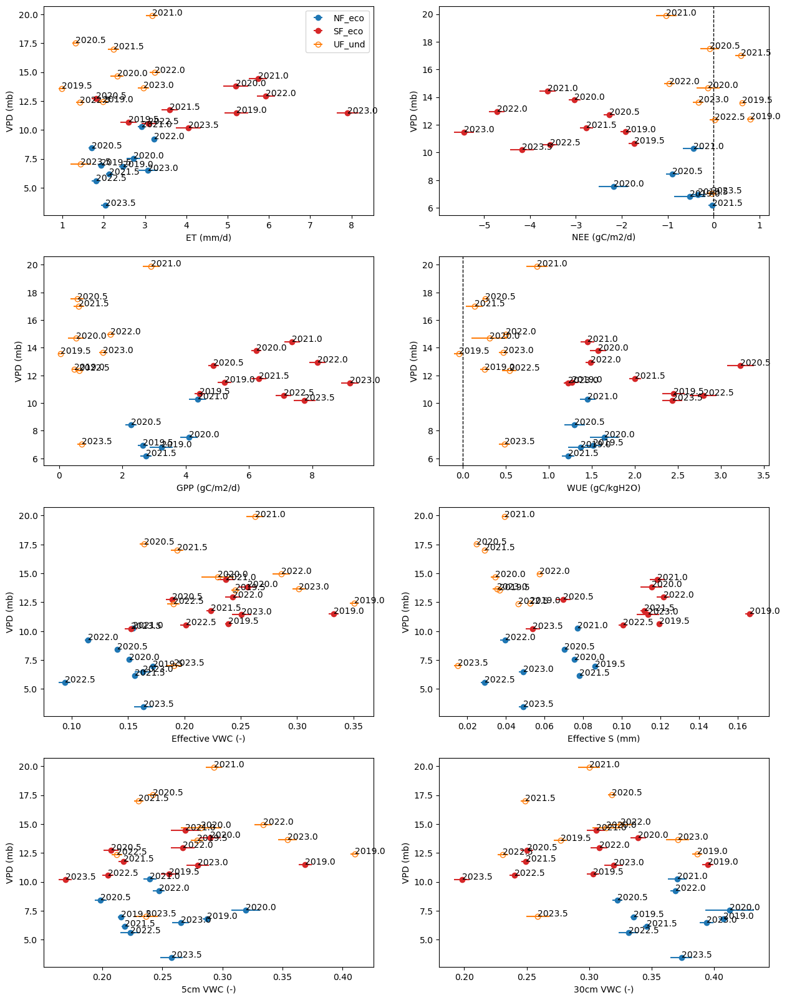

In [26]:
fig, axs = plt.subplots(4, 2, figsize=(15,20))
axs = axs.flatten()

axs[0].set_xlabel("ET (mm/d)")
axs[1].set_xlabel("NEE (gC/m2/d)")
axs[2].set_xlabel("GPP (gC/m2/d)")
axs[3].set_xlabel("WUE (gC/kgH2O)")
axs[4].set_xlabel("Effective VWC (-)")
axs[5].set_xlabel("Effective S (mm)")
axs[6].set_xlabel("5cm VWC (-)")
axs[7].set_xlabel("30cm VWC (-)")
for ax in axs:
    ax.set_ylabel("VPD (mb)")

warnings.simplefilter("ignore")
import warnings
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", message="posx and posy should be finite values")
def label_point(ax, df, grouping_col, xcol, ycol, xmult=1, ymult=1):
    for d in df[grouping_col]:
        x = df.loc[df[grouping_col] == d, xcol].iloc[0]
        y = df.loc[df[grouping_col] == d, ycol].iloc[0]
        if ~np.isnan(x) & ~np.isnan(y):
            ax.text(x*xmult, y*ymult, d)

y = "VPD"
yerr = "VPD_StdErr"
for site, df in merged.groupby("Site"):
    print(site)
    if "NF" in site: color = "C0"
    if "UF" in site: color = "C1"
    if "SF" in site: color = "C3"
    facecolor = color
    if "und" in site: facecolor = "none"
    if site != "UF_eco" and site != "NF_und":
        axs[0].errorbar(df["ET"]*1000, df[y], xerr=df["ET_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, label=site, color=color, )#facecolor=facecolor)
        label_point(axs[0], df, grouping_col, "ET", y, 1000)
        
        axs[1].errorbar(df["NEE"]*1000, df[y], xerr=df["NEE_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[1], df, grouping_col, "NEE", y, 1000)
        
        axs[2].errorbar(df["GPP"]*1000, df[y], xerr=df["GPP_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[2], df, grouping_col, "GPP", y, 1000)
        
        axs[3].errorbar(df["WUE"], df[y], xerr=df["WUE_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[3], df, grouping_col, "WUE", y)
        
        axs[4].errorbar(df["VWCeff"], df[y], xerr=df["VWCeff_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[4], df, grouping_col, "VWCeff", y)
        
        axs[5].errorbar(df["Seff"], df[y], xerr=df["Seff_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[5], df, grouping_col, "Seff", y)
        
        axs[6].errorbar(df["VWC.5"], df[y], xerr=df["VWC.5_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[6], df, grouping_col, "VWC.5", y)
        
        axs[7].errorbar(df["VWC.50"], df[y], xerr=df["VWC.30_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[7], df, grouping_col, "VWC.50", y)
        
        
        
axs[0].legend()

ylim = axs[1].get_ylim()
axs[1].vlines(0, *ylim, "k", "--", lw=1)
axs[1].set_ylim(ylim)
ylim = axs[3].get_ylim()
axs[3].vlines(0, *ylim, "k", "--", lw=1)
axs[3].set_ylim(ylim)

fig.savefig("figs/WUE_scatterplots.png")
warnings.resetwarnings()

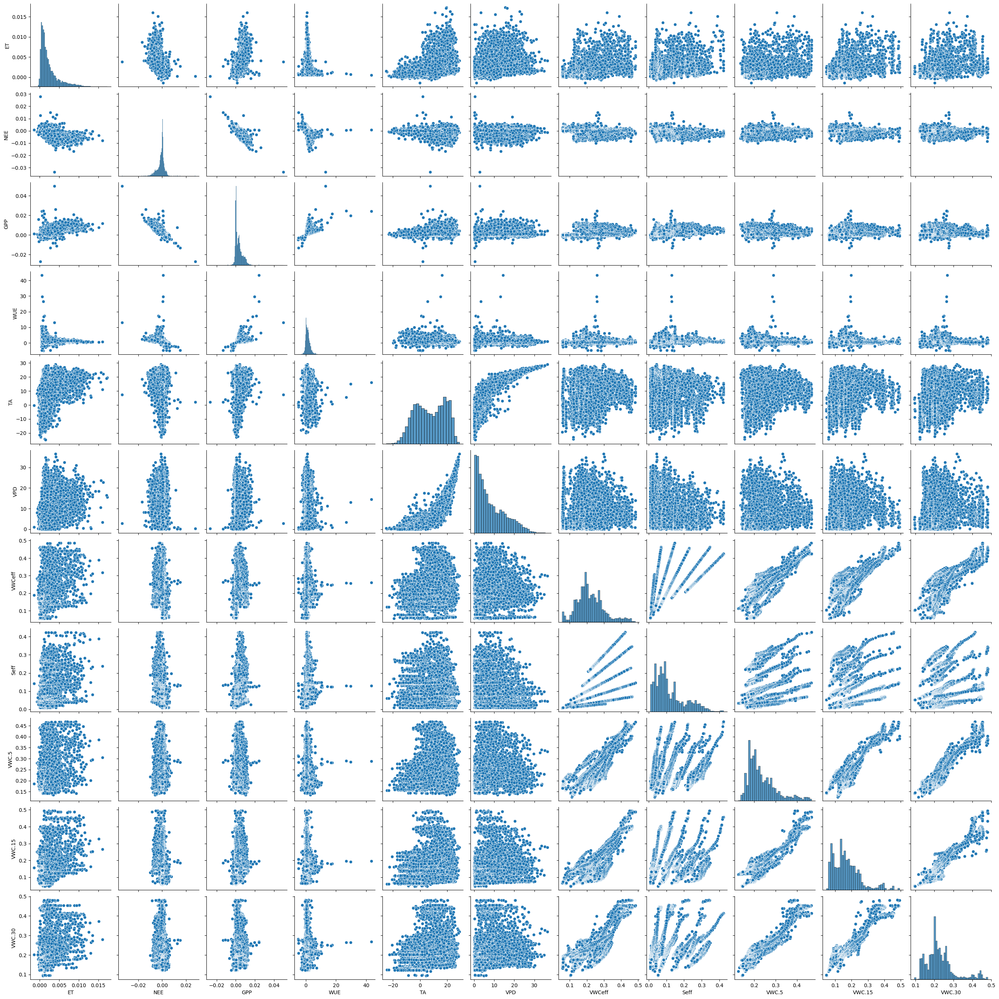

In [57]:
sns.pairplot(flux_long[["ET", "NEE", "GPP", "WUE", "TA", "VPD", "VWCeff", "Seff", "VWC.5", "VWC.15", "VWC.30"]])#, hue=WUE_long["Site"])

NF_eco
NF_und
SF_eco
UF_eco
UF_und


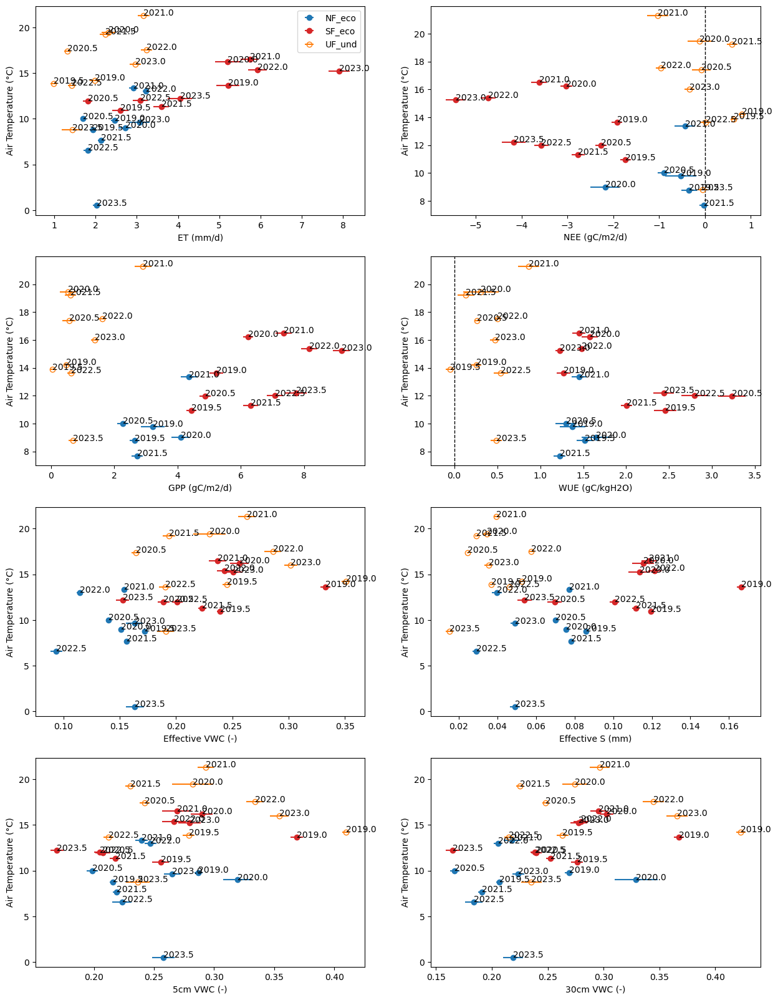

In [100]:
fig, axs = plt.subplots(4, 2, figsize=(15,20))
axs = axs.flatten()

axs[0].set_xlabel("ET (mm/d)")
axs[1].set_xlabel("NEE (gC/m2/d)")
axs[2].set_xlabel("GPP (gC/m2/d)")
axs[3].set_xlabel("WUE (gC/kgH2O)")
axs[4].set_xlabel("Effective VWC (-)")
axs[5].set_xlabel("Effective S (mm)")
axs[6].set_xlabel("5cm VWC (-)")
axs[7].set_xlabel("30cm VWC (-)")
for ax in axs:
    ax.set_ylabel("Air Temperature (°C)")

warnings.simplefilter("ignore")
import warnings
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", message="posx and posy should be finite values")
def label_point(ax, df, grouping_col, xcol, ycol, xmult=1, ymult=1):
    for d in df[grouping_col]:
        x = df.loc[df[grouping_col] == d, xcol].iloc[0]
        y = df.loc[df[grouping_col] == d, ycol].iloc[0]
        if ~np.isnan(x) & ~np.isnan(y):
            ax.text(x*xmult, y*ymult, d)

y = "TA"
yerr = "TA_StdErr"
for site, df in merged.groupby("Site"):
    print(site)
    if "NF" in site: color = "C0"
    if "UF" in site: color = "C1"
    if "SF" in site: color = "C3"
    facecolor = color
    if "und" in site: facecolor = "none"
    if site != "UF_eco" and site != "NF_und":
        axs[0].errorbar(df["ET"]*1000, df[y], xerr=df["ET_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, label=site, color=color, )#facecolor=facecolor)
        label_point(axs[0], df, grouping_col, "ET", y, 1000)
        
        axs[1].errorbar(df["NEE"]*1000, df[y], xerr=df["NEE_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[1], df, grouping_col, "NEE", y, 1000)
        
        axs[2].errorbar(df["GPP"]*1000, df[y], xerr=df["GPP_stderr"]*1000, linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[2], df, grouping_col, "GPP", y, 1000)
        
        axs[3].errorbar(df["WUE"], df[y], xerr=df["WUE_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[3], df, grouping_col, "WUE", y)
        
        axs[4].errorbar(df["VWCeff"], df[y], xerr=df["VWCeff_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[4], df, grouping_col, "VWCeff", y)
        
        axs[5].errorbar(df["Seff"], df[y], xerr=df["Seff_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[5], df, grouping_col, "Seff", y)
        
        axs[6].errorbar(df["VWC.5"], df[y], xerr=df["VWC.5_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[6], df, grouping_col, "VWC.5", y)
        
        axs[7].errorbar(df["VWC.30"], df[y], xerr=df["VWC.30_stderr"], linestyle="none", marker="o", markerfacecolor=facecolor, color=color, )#facecolor=facecolor)
        label_point(axs[7], df, grouping_col, "VWC.30", y)
        
        
        
axs[0].legend()

ylim = axs[1].get_ylim()
axs[1].vlines(0, *ylim, "k", "--", lw=1)
axs[1].set_ylim(ylim)
ylim = axs[3].get_ylim()
axs[3].vlines(0, *ylim, "k", "--", lw=1)
axs[3].set_ylim(ylim)

fig.savefig("figs/WUE_scatterplots.png")
warnings.resetwarnings()

Higher uptake depth is associated with high GPP

# Budyko Analysis


In [58]:
def ZDW_01(PET, P):
    w=1.06
    return (1 + w*PET/P)/(1 + w*(PET/P) + (PET/P)**-1)

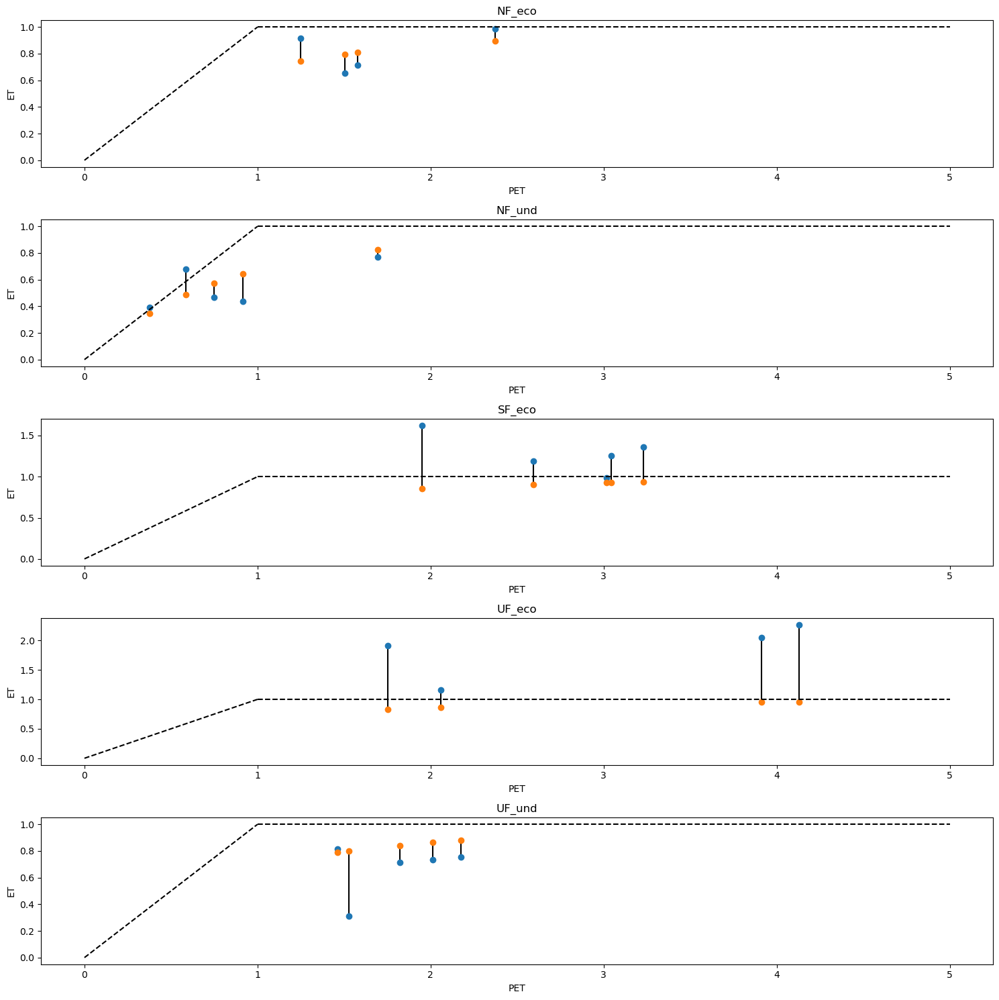

In [59]:
fzm = np.where(flux_long["Site"] == "NF_eco", 18, np.nan)
fzm = np.where(flux_long["Site"] == "NF_und", 3, fzm)
fzm = np.where(flux_long["Site"] == "UF_und", 3, fzm)
fzm = np.where(flux_long["Site"] == "SF_eco", 4, fzm)
zm = np.where(flux_long["Site"] == "UF_eco", 16, fzm)

fzc = np.where(flux_long["Site"] == "NF_eco", 16, np.nan)
fzc = np.where(flux_long["Site"] == "NF_und", 0.1, fzc)
fzc = np.where(flux_long["Site"] == "UF_und", 0.1, fzc)
fzc = np.where(flux_long["Site"] == "SF_eco", 0.7, fzc)
zc = np.where(flux_long["Site"] == "UF_eco", 16, fzc)


flux_long["PET"] = penman_monteith(
    T_c=flux_long["TA"],
    Rn_W=flux_long["Rnet"],
    G_W=flux_long["Rnet"]*0.09,
    vpd_kPa=flux_long["VPD"]*0.1,
    LAI=5,
    u=flux_long["WS"],
    zm=zm,
    zc=zc,
    Pa_kPa=77
)*86400/1000  # m/d

color = {
    "NF_eco": "C0",
    "NF_und": "C0",
    "SF_eco": "C3",
    "UF_eco": "C1",
    "UF_und": "C1"
}
fig, axs = plt.subplots(5, 1, figsize=(15,15))


for i, (s, df) in enumerate(flux_long.set_index("TIMESTAMP").groupby(["Site", "WY"])[["ET", "PET", "P_annual"]].mean().reset_index().groupby("Site")):
    # axs[i, 0].plot(df["WY_Season"], df["PET"]*1000, label="PET")
    # axs[i, 0].plot(df["WY_Season"], df["ET"]*1000, label="ET")
    # axs[i, 0].plot(df["WY_Season"], df["P_Season_cum"], label="P")
    axs[i].scatter(df["PET"]*30*12/(df["P_annual"]), df["ET"]*30*12/(df["P_annual"]))
    PET = np.logspace(0, 0.7, 101)
    axs[i].scatter(df["PET"]*30*12/df["P_annual"], ZDW_01(df["PET"]*30*12, df["P_annual"]))
    
    for ipet, iet, ip, isite, imonth in zip(df["PET"], df["ET"], df["P_annual"], df["Site"], df.WY):        
        axs[i].plot([ipet*30*12/ip, ipet*30*12/ip], [iet*30*12/ip, ZDW_01(ipet*30*12, ip)], color='k', zorder=0)
    axs[i].plot([0, 1], [0, 1], 'k--')
    axs[i].plot([1, 5], [1, 1], 'k--')
    axs[i].set_xlabel("PET")
    axs[i].set_ylabel("ET")
    axs[i].set_title(s)

plt.tight_layout()


NF_eco
NF_und
SF_eco
UF_eco
UF_und


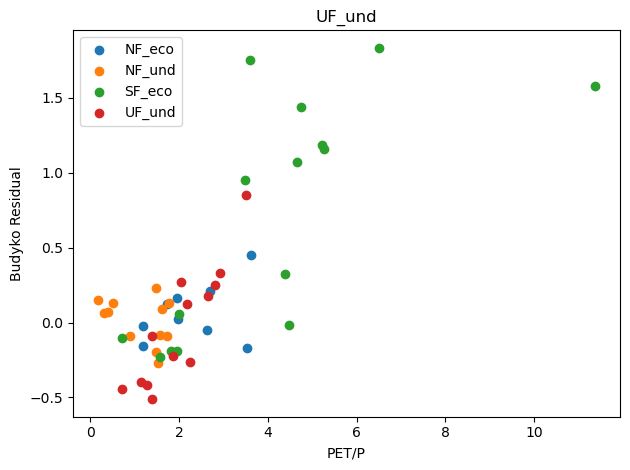

In [60]:
fzm = np.where(flux_long["Site"] == "NF_eco", 18, np.nan)
fzm = np.where(flux_long["Site"] == "NF_und", 3, fzm)
fzm = np.where(flux_long["Site"] == "UF_und", 3, fzm)
fzm = np.where(flux_long["Site"] == "SF_eco", 4, fzm)
zm = np.where(flux_long["Site"] == "UF_eco", 18, fzm)

fzc = np.where(flux_long["Site"] == "NF_eco", 16, np.nan)
fzc = np.where(flux_long["Site"] == "NF_und", 0.1, fzc)
fzc = np.where(flux_long["Site"] == "UF_und", 0.1, fzc)
fzc = np.where(flux_long["Site"] == "SF_eco", 0.5, fzc)
zc = np.where(flux_long["Site"] == "UF_eco", 16, fzc)


flux_long["PET"] = penman_monteith(
    T_c=flux_long["TA"],
    Rn_W=flux_long["Rnet"],
    G_W=flux_long["Rnet"]*0.09,
    vpd_kPa=flux_long["VPD"]*0.1,
    LAI=5,
    u=flux_long["WS"],
    zm=zm,
    zc=zc,
    Pa_kPa=77
)*86400/1000  # m/d

color = {
    "NF_eco": "C0",
    "NF_und": "C0",
    "SF_eco": "C3",
    "UF_eco": "C1",
    "UF_und": "C1"
}
# fig, axs = plt.subplots(5, 1, figsize=(15,15))


for i, (s, df) in enumerate(flux_long.set_index("TIMESTAMP").groupby(["Site", "WY_Season"])[["ET", "PET", "P_Season_cum"]].mean().reset_index().groupby("Site")):
    # axs[i, 0].plot(df["WY_Season"], df["PET"]*1000, label="PET")
    # axs[i, 0].plot(df["WY_Season"], df["ET"]*1000, label="ET")
    # axs[i, 0].plot(df["WY_Season"], df["P_Season_cum"], label="P")
    # axs[i].scatter(df["PET"]*30*12/df["P_Season_cum"], ZDW_01(df["PET"]*30*12, df["P_Season_cum"]))

    print(s)
    if s in ["NF_eco", "UF_und", "NF_und", "SF_eco"]:
        plt.scatter(df["PET"]*30*12/df["P_Season_cum"], df["ET"]*30*12/(df["P_Season_cum"])-ZDW_01(df["PET"]*30*12, df["P_Season_cum"]), label=s)
    
    # # for ipet, iet, ip, isite, imonth in zip(df["PET"], df["ET"], df["P_Season_cum"], df["Site"], df.WY_Season):        
    # #     axs[i].plot([ipet*30*12/ip, ipet*30*12/ip], [iet*30*12/ip, ZDW_01(ipet*30*12, ip)], color='k', zorder=0)
    # # axs[i].plot([0, 1], [0, 1], 'k--')
    # # axs[i].plot([1, 5], [1, 1], 'k--')
plt.xlabel("PET/P")
plt.ylabel("Budyko Residual")
plt.title(s)

plt.legend()
plt.tight_layout()


2018.0
2019.0
2020.0
2021.0
2022.0
2023.0
2024.0
2025.0


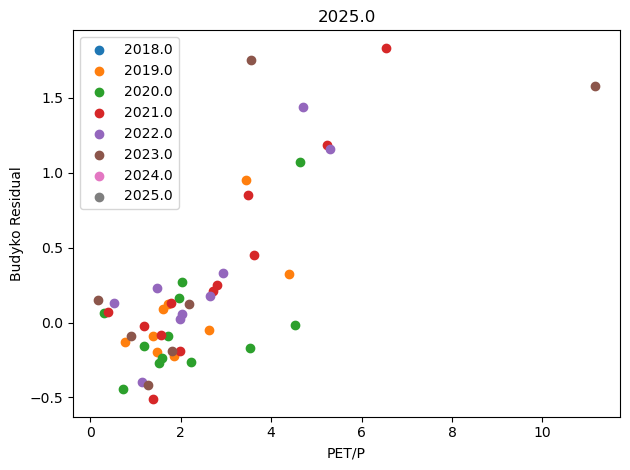

In [61]:
fzm = np.where(flux_long["Site"] == "NF_eco", 18, np.nan)
fzm = np.where(flux_long["Site"] == "NF_und", 3, fzm)
fzm = np.where(flux_long["Site"] == "UF_und", 3, fzm)
fzm = np.where(flux_long["Site"] == "SF_eco", 4, fzm)
zm = np.where(flux_long["Site"] == "UF_eco", 16, fzm)

fzc = np.where(flux_long["Site"] == "NF_eco", 16, np.nan)
fzc = np.where(flux_long["Site"] == "NF_und", 0.1, fzc)
fzc = np.where(flux_long["Site"] == "UF_und", 0.1, fzc)
fzc = np.where(flux_long["Site"] == "SF_eco", 0.7, fzc)
zc = np.where(flux_long["Site"] == "UF_eco", 16, fzc)


flux_long["PET"] = penman_monteith(
    T_c=flux_long["TA"],
    Rn_W=flux_long["Rnet"],
    G_W=flux_long["Rnet"]*0.09,
    vpd_kPa=flux_long["VPD"]*0.1,
    LAI=5,
    u=flux_long["WS"],
    zm=zm,
    zc=zc,
    Pa_kPa=77
)*86400/1000  # m/d

color = {
    "NF_eco": "C0",
    "NF_und": "C0",
    "SF_eco": "C3",
    "UF_eco": "C1",
    "UF_und": "C1"
}
# fig, axs = plt.subplots(5, 1, figsize=(15,15))


for i, (s, df) in enumerate(flux_long.loc[flux_long.Site.isin(["NF_eco", "UF_und", "NF_und", "SF_eco"])].set_index("TIMESTAMP").groupby(["Site", "WY_Season"])[["ET", "PET", "P_Season_cum", "WY"]].mean().reset_index().groupby("WY")):
    # axs[i, 0].plot(df["WY_Season"], df["PET"]*1000, label="PET")
    # axs[i, 0].plot(df["WY_Season"], df["ET"]*1000, label="ET")
    # axs[i, 0].plot(df["WY_Season"], df["P_Season_cum"], label="P")
    # axs[i].scatter(df["PET"]*30*12/df["P_Season_cum"], ZDW_01(df["PET"]*30*12, df["P_Season_cum"]))

    print(s)
    # if s in ["NF_eco", "UF_und", "NF_und", "SF_eco"]:
    plt.scatter(df["PET"]*30*12/df["P_Season_cum"], df["ET"]*30*12/(df["P_Season_cum"])-ZDW_01(df["PET"]*30*12, df["P_Season_cum"]), label=s)
    
    # # for ipet, iet, ip, isite, imonth in zip(df["PET"], df["ET"], df["P_Season_cum"], df["Site"], df.WY_Season):        
    # #     axs[i].plot([ipet*30*12/ip, ipet*30*12/ip], [iet*30*12/ip, ZDW_01(ipet*30*12, ip)], color='k', zorder=0)
    # # axs[i].plot([0, 1], [0, 1], 'k--')
    # # axs[i].plot([1, 5], [1, 1], 'k--')
plt.xlabel("PET/P")
plt.ylabel("Budyko Residual")
plt.title(s)

plt.legend()
plt.tight_layout()


# PROBLEM: NEED TO HAVE A CUMULATIVE ET VALUE

       WY_Season    Site  P_annual  P_seasonal  P_Season_cum  index       PET  \
0    Spring 2018  NF_eco  0.457200    0.292100       0.06350      0       NaN   
5    Spring 2019  NF_eco  0.985520    0.749300       0.87630      5  0.769797   
10   Spring 2020  NF_eco  0.800100    0.665480       0.84328     10  0.840210   
15   Spring 2021  NF_eco  0.922020    0.716280       0.65532     15  0.901526   
20   Spring 2022  NF_eco  0.734060    0.591820       0.68072     20       NaN   
25   Spring 2023  NF_eco  0.795020    0.612140       0.76200     25       NaN   
30   Spring 2024  NF_eco  0.861060    0.802640       0.75184     30       NaN   
35   Summer 2018  NF_eco  0.457200    0.165100       0.14986     35       NaN   
40   Summer 2019  NF_eco  0.985520    0.236220       0.98552     40  1.313982   
45   Summer 2020  NF_eco  0.800100    0.134620       0.93472     45  1.682238   
50   Summer 2021  NF_eco  0.922020    0.205740       0.77978     50  1.434858   
55   Summer 2022  NF_eco  0.

/tmp/ipykernel_117798/902355073.py:3: RuntimeWarning: divide by zero encountered in reciprocal
  return (1 + w*PET/P)/(1 + w*(PET/P) + (PET/P)**-1)


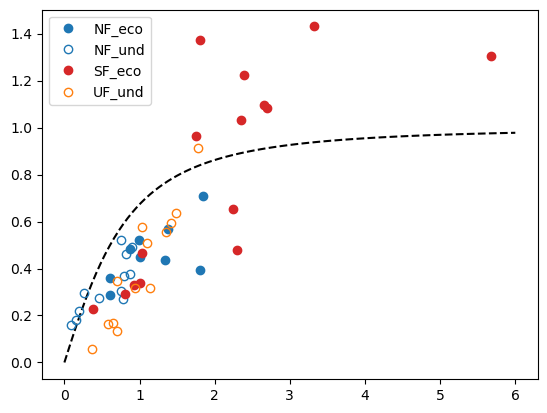

In [94]:
mean_flux = flux_long.groupby(["WY_Season", "Site"])[["PET", "ET"]].mean()
n = flux_long.groupby(["WY_Season", "Site"])[["P_annual", "P_seasonal", "P_Season_cum"]].count()["P_annual"].max()

budyko_df = (
    flux_long.groupby(["WY_Season", "Site"])[["P_annual", "P_seasonal", "P_Season_cum"]].mean().reset_index()
    .merge((mean_flux*n).reset_index().reset_index(), on=["WY_Season", "Site"])
)
budyko_df

color = {
    "NF_eco": "C0",
    "NF_und": "C0",
    "SF_eco": "C3",
    "UF_eco": "C1",
    "UF_und": "C1"
}
fill = {
    "NF_eco": None,
    "NF_und": "none",
    "SF_eco": None,
    "UF_eco": None,
    "UF_und": "none"
}
plt.plot(np.linspace(0, 6, 101), ZDW_01(np.linspace(0, 6, 101), 1), 'k--')
for s, df in budyko_df.groupby("Site"):
    df["PET_Season_cum"] = np.where(
        df["WY_Season"].str[:6]
    )
    if s in ["NF_eco", "SF_eco", "UF_und", "NF_und"]:
        plt.plot(df["PET"]/df["P_Season_cum"], df["ET"]/df["P_Season_cum"], "o", label=s, markerfacecolor=fill[s], color=color[s])
        # for ipet, ip, iet, iwys in zip(df["PET"], df["P_seasonal"], df["ET"], df["WY_Season"]):
        #     plt.text(ipet/ip, iet/ip, iwys)
plt.legend()
# plt.scatter(budyko_df["PET"]/budyko_df["P_annual"], budyko_df["ET"]/budyko_df["P_annual"])


In [49]:
df

,WY_Season,Site,P_annual,P_seasonal,PET,ET
4,Spring 2019,UF_und,0.985520,0.749300,0.198275,0.112609
9,Spring 2020,UF_und,0.800100,0.665480,0.014276,0.007961
14,Spring 2021,UF_und,0.922020,0.716280,0.127304,0.071938
19,Spring 2022,UF_und,0.734060,0.591820,0.406842,0.179220
24,Spring 2023,UF_und,0.795020,0.612140,0.193193,0.161124
29,Summer 2019,UF_und,0.985520,0.236220,0.371676,0.157068
34,Summer 2020,UF_und,0.800100,0.134620,0.400358,0.116369
39,Summer 2021,UF_und,0.922020,0.205740,0.546253,0.232359
44,Summer 2022,UF_und,0.734060,0.142240,0.562372,0.254470
49,Summer 2023,UF_und,0.795020,0.182880,0.000000,0.144852


what about the recovery of this ecosystem is affecting the balance supply/demand between the atmosphere and ground (could be a good start for a title)

* envirnomental factors (radiation, etc)
* where water is accessible (soiul moisture depth and availability)
* how badly do the plants want to water (growth limitation?)

Look at the atmospheric behavior

look at the soil behavior

look at the balance

ag and forest met?

-- author guidelines, word counts, examples

-- jgr biogeosciences